In [1]:
import sys
import os
import pandas as pd
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

sys.path.append(os.path.abspath("../scripts"))

In [2]:
from data_loader import load_clean_data
from metrics import get_sentiment_proportions, compute_sentiment_ratios
from metrics import compute_ratios_comfort
from visualization import (
    plot_percentages, plot_stacked_bar_chart, plot_comfort, plot_exposure, plot_income, 
    plot_stacked_bar_chart_interaction
)
from sentiment_utils import (
    compute_sentiment_metrics, interpret_metrics, plot_sentiment_trend
)

In [3]:
data_path = "../data/muslim_brand_july_2025.csv"
july25 = load_clean_data(data_path)

In [4]:
july25.columns

Index(['Start Date', 'End Date', 'What is your religion?', 'Religion_other',
       'How many Muslim people have you talked to in the last 7 days?',
       'How do you feel about Muslim people in America?',
       'What is your level of education?', 'Where do you get your news from?',
       'News_other',
       'How comfortable do you feel interacting with Muslims in your community?',
       'How often do you hear positive things about Muslims in the media?',
       'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?',
       'Would you feel comfortable buying goods or services from a Muslim-owned business?',
       'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?',
       'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?',
       'Do you feel you have a lot in common with Muslims in America?',
       'If you had questions about Isla

# Categories

1. Religion
2. Levels of Exposure to Muslims
3. Education
4. News Source
5. Income Level
6. Gender
7. Age
8. Major US Region


# Questions

1. 'How do you feel about Muslim people in America?'
2. 'How comfortable do you feel interacting with Muslims in your community?'
3. 'How often do you hear positive things about Muslims in the media?'
4.   'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?'
5. 'Would you feel comfortable buying goods or services from a Muslim-owned business?'
6. 'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?'
7. 'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?'
8. 'Do you feel you have a lot in common with Muslims in America?'
9. 'If you had questions about Islam or Muslims, where would you go to learn more?',
10. 'Have you ever changed your opinion about a group of people after getting to know someone personally'

# Compute Key Metrics

In [5]:
# Sentiment proportions
sentiment_prop = get_sentiment_proportions(july25, 'How do you feel about Muslim people in America?')
display(sentiment_prop)

# Ratios
pos_neg_ratio, pos_neutral_ratio = compute_sentiment_ratios(july25, \
                                                            'How do you feel about Muslim people in America?')
net_sentiment_july_25 = sentiment_prop.iloc[0,1]-sentiment_prop.iloc[2,1]
print(f"Positive to Negative Ratio: {pos_neg_ratio:.2f}")
print(f"Positive to Neutral Ratio: {pos_neutral_ratio:.2f}")
print(f"Net Sentiment Score: {net_sentiment_july_25:.2f}")

,Category,Percentage
0,Good,63.063063
1,Neutral,31.531532
2,Bad,5.405405


Positive to Negative Ratio: 11.67
Positive to Neutral Ratio: 2.00
Net Sentiment Score: 57.66


# Comfort Metrics

In [6]:
question = 'How comfortable do you feel interacting with Muslims in your community?'
comfort_level = get_sentiment_proportions(july25, question)

In [7]:
comfort_level

,Category,Percentage
0,Very comfortable,56.756757
1,Comfortable,22.522523
2,Neutral,15.315315
3,Uncomfortable,5.405405


In [8]:
ratios = compute_ratios_comfort(comfort_level)

In [9]:
ratios

Very comfortable / Neutral           3.705882
Comfortable / Neutral                1.470588
Very comfortable / Uncomfortable    10.500000
Comfortable / Uncomfortable          4.166667
Name: Ratio, dtype: float64

# Visualizations

## Overall Public Opinion

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Public_Opinion_on_Muslims_July_2025.png


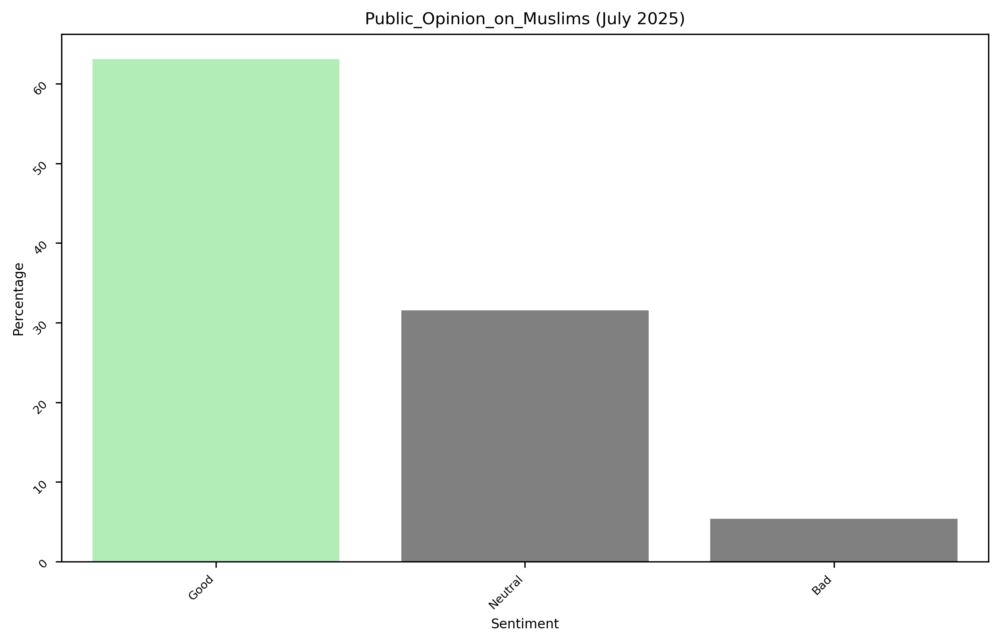

In [10]:
plot_percentages(july25,
                 column_name='How do you feel about Muslim people in America?',
                 x_label='Sentiment',
                 title='Public_Opinion_on_Muslims (July 2025)')

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Comfort_levels_Around_Muslims_in_America_July_2025.png


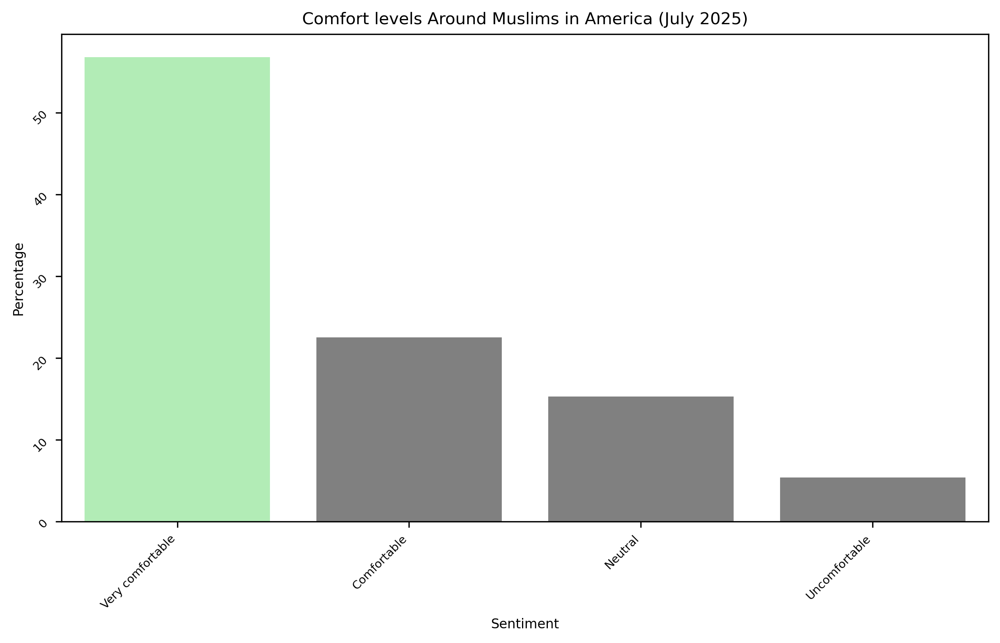

In [11]:
plot_percentages(july25,
                 column_name='How comfortable do you feel interacting with Muslims in your community?',
                 x_label='Sentiment',
                 title='Comfort levels Around Muslims in America (July 2025)')

## Religion Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Distribution_of_Religion_July_2025.png


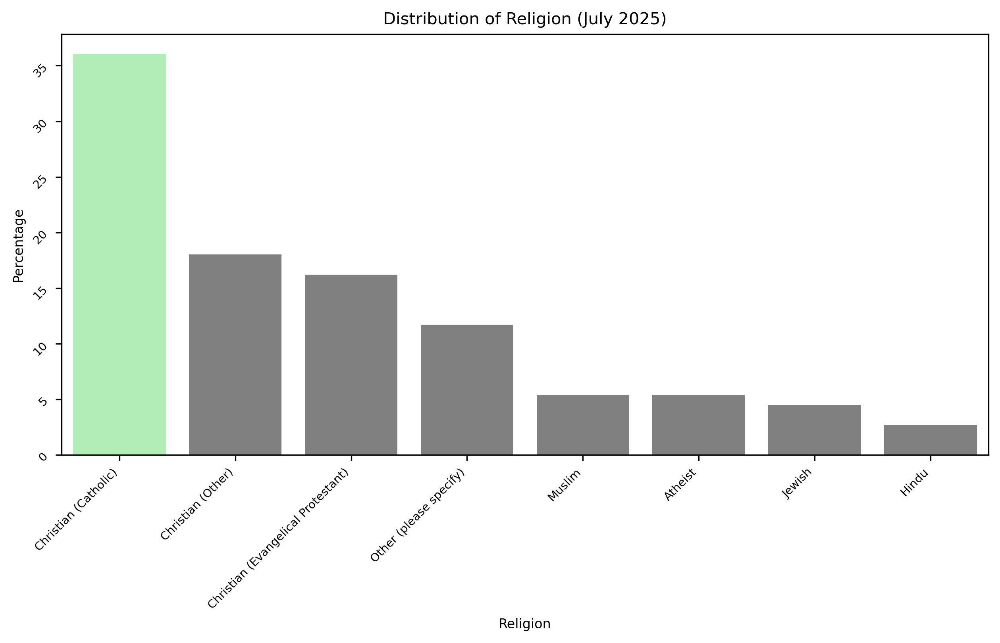

In [42]:
plot_percentages(july25,
                 column_name='What is your religion?',
                 x_label='Religion',
                 title='Distribution of Religion (July 2025)')

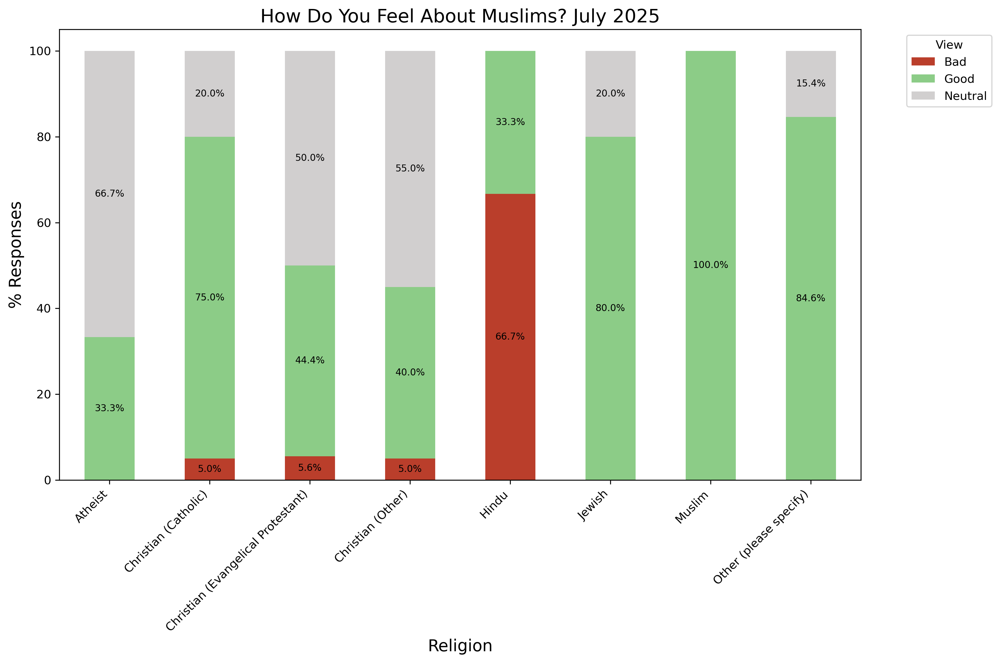

In [46]:
plot_stacked_bar_chart(july25,
                       title='How Do You Feel About Muslims? July 2025',
                       xlabel='Religion',
                       ylabel='% Responses',
                       cat_col='What is your religion?',
                       sent_col='How do you feel about Muslim people in America?')

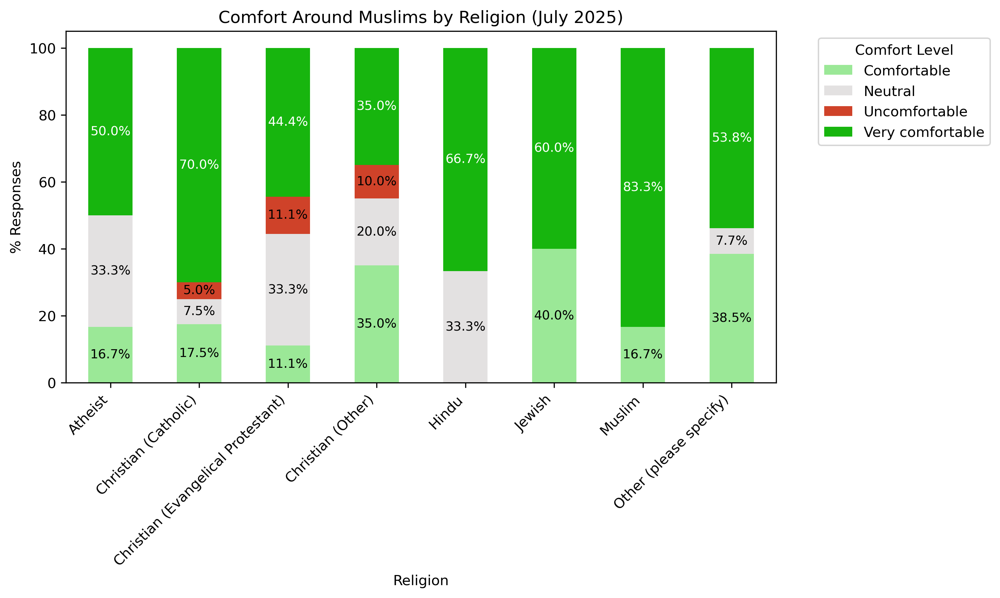

In [47]:
plot_comfort(july25,
             category_col='What is your religion?',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Religion (July 2025)',
             xlabel='Religion',
             ylabel='% Responses')

## Gender Vs. Sentiment

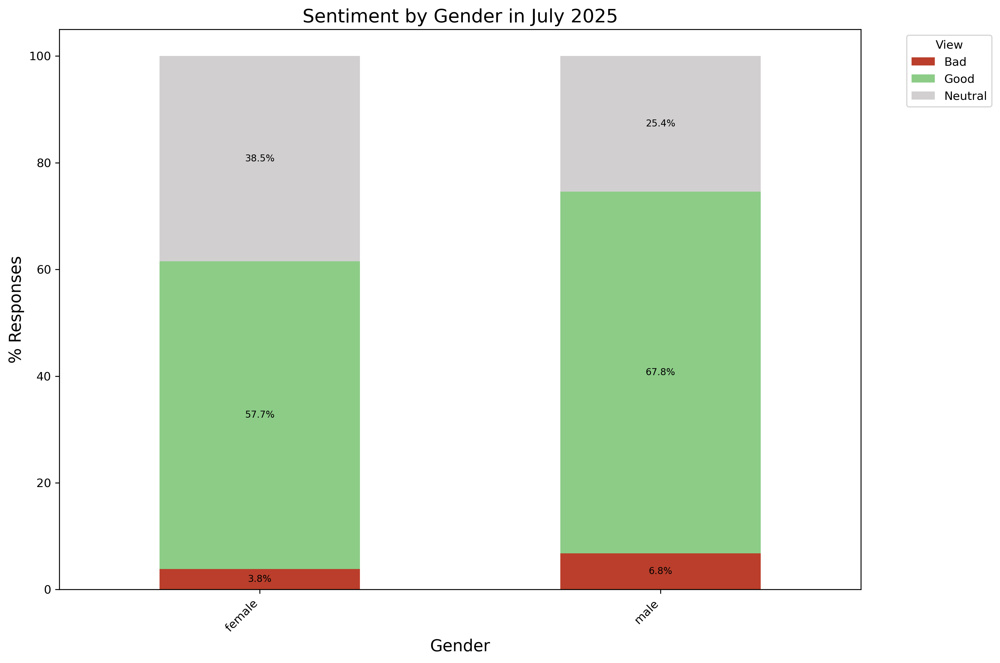

In [48]:
plot_stacked_bar_chart(july25,
                       title='Sentiment by Gender in July 2025',
                       xlabel='Gender',
                       ylabel='% Responses',
                       cat_col='Gender',
                       sent_col='How do you feel about Muslim people in America?')

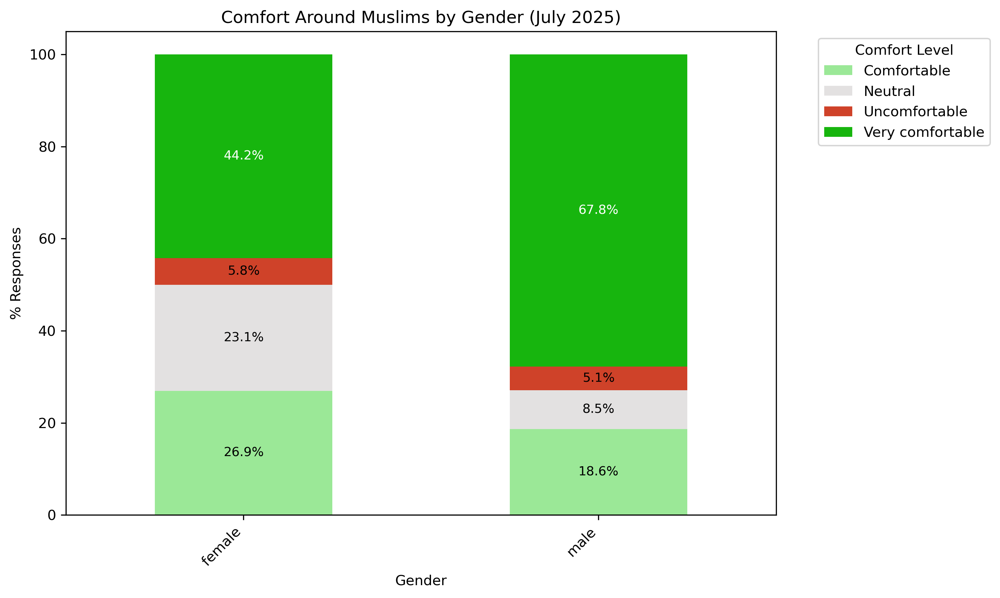

In [49]:
plot_comfort(july25,
             category_col= 'Gender',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Gender (July 2025)',
             xlabel='Gender',
             ylabel='% Responses')

## Education Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/The_Majority_of_Those_Surveyed_Hold_Degrees_In_Higher_Education.png


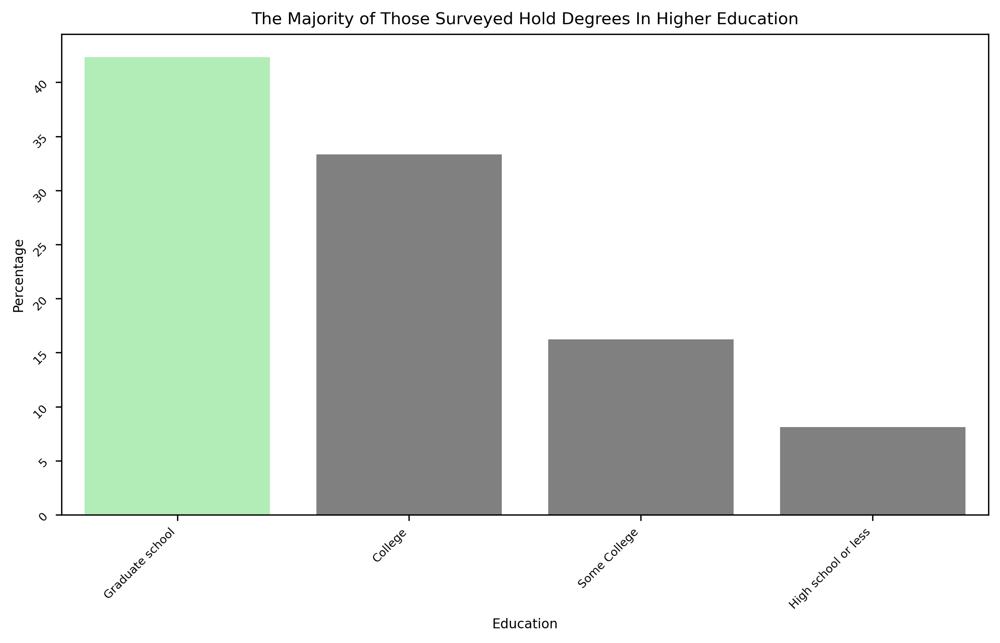

In [12]:
plot_percentages(july25,'What is your level of education?', 'Education',
           'The Majority of Those Surveyed Hold Degrees In Higher Education')

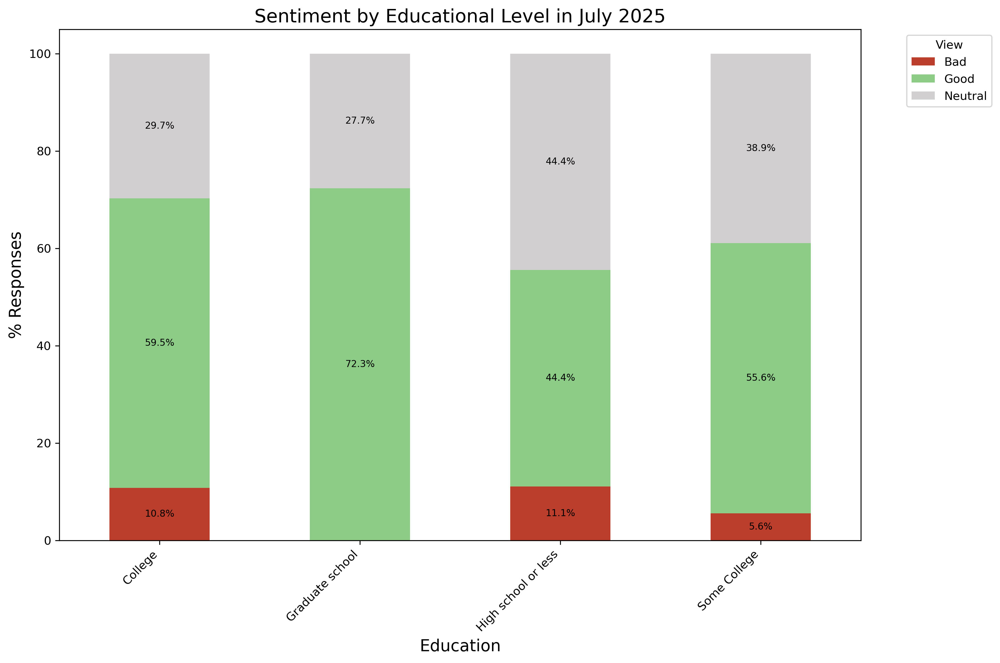

In [50]:
plot_stacked_bar_chart(july25,
                       title='Sentiment by Educational Level in July 2025',
                       xlabel='Education',
                       ylabel='% Responses',
                       cat_col='What is your level of education?',
                       sent_col='How do you feel about Muslim people in America?')

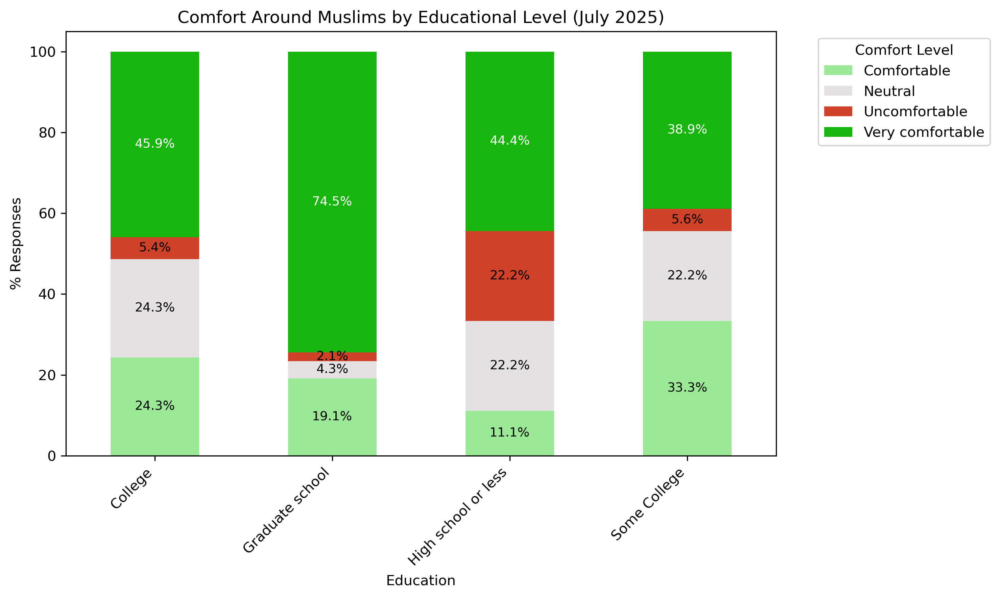

In [13]:
plot_comfort(july25,
             category_col= 'What is your level of education?',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Educational Level (July 2025)',
             xlabel='Education',
             ylabel='% Responses')

# Age Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/More_than_75%_Of_Survey_Partipants_are_aged_30-60_July_25.png


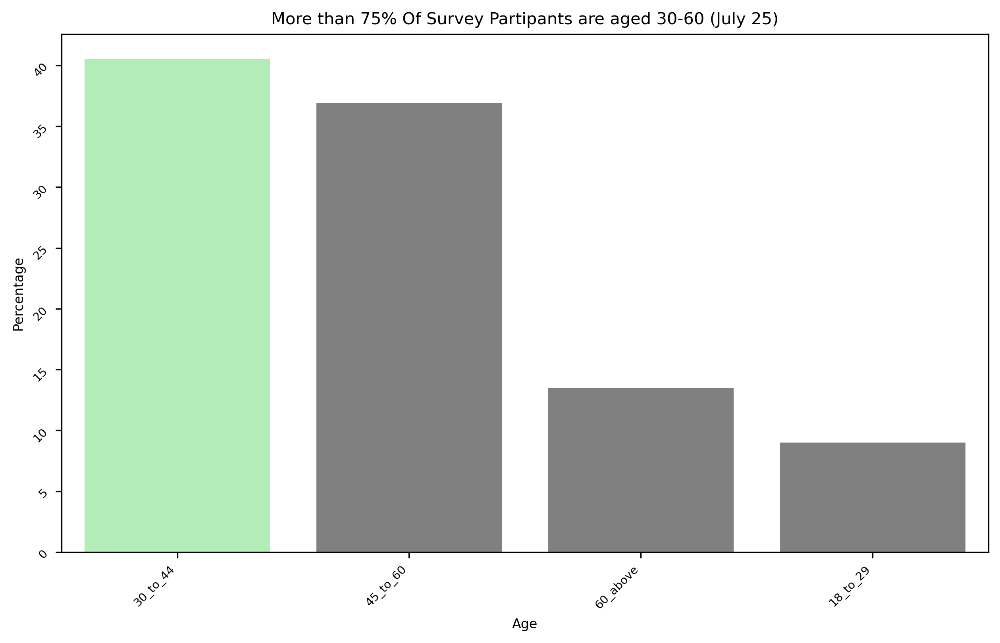

In [14]:
plot_percentages(july25,'Age', 'Age',
           'More than 75% Of Survey Partipants are aged 30-60 (July 25)')

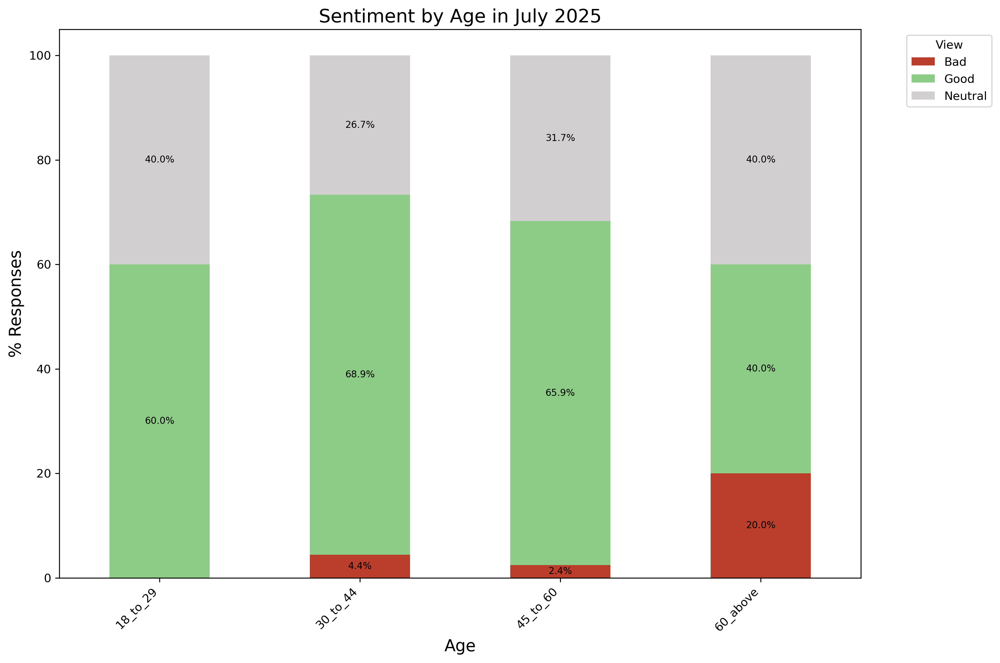

In [51]:
plot_stacked_bar_chart(july25,
                       title='Sentiment by Age in July 2025',
                       xlabel='Age',
                       ylabel='% Responses',
                       cat_col='Age',
                       sent_col='How do you feel about Muslim people in America?')

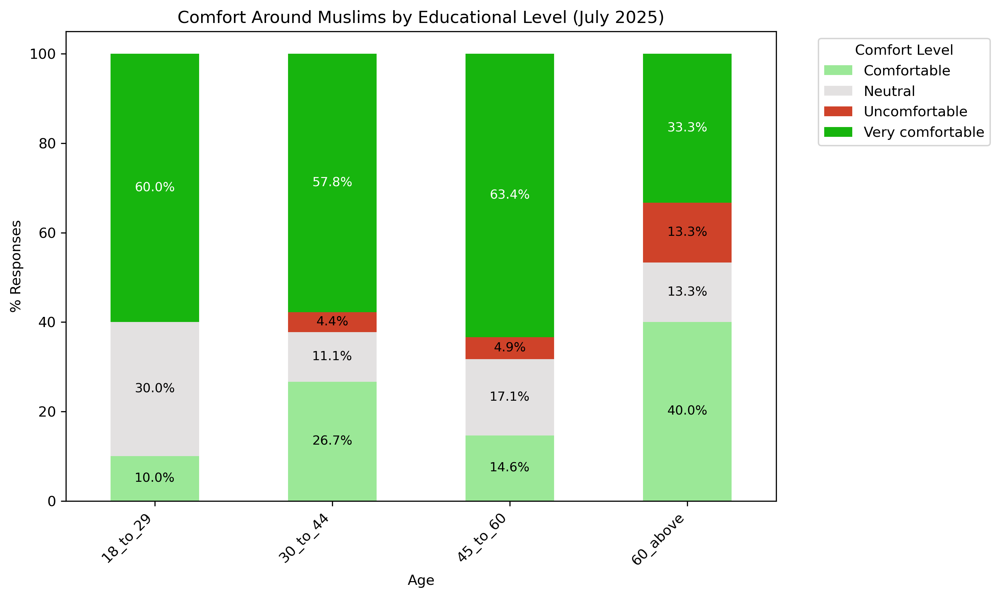

In [52]:
plot_comfort(july25,
             category_col= 'Age',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Educational Level (July 2025)',
             xlabel='Age',
             ylabel='% Responses')

## Income Vs Sentiment

In [16]:
income_mapping = {"25000_to_49999": "25k-49k",
"50000_to_74999":"50k-74k",
"75000_to_99999": "75k-99k",
"125000_to_149999": "125k-149k",
"100000_to_124999" :"100k-124k",
"0_to_9999"        : "0-9k",
"no_answer":    "undisclosed",
"150000_to_174999":"150k-174k",
"10000_to_24999" : "10k-24k",
"200000_and_up":   "200k_up",
"175000_to_199999": "175k-199k"}

july25['Household Income'] = july25['Household Income'].replace(income_mapping)

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Most_Survey_Respondents_Are_Upper_Middle_Class_Earners.png


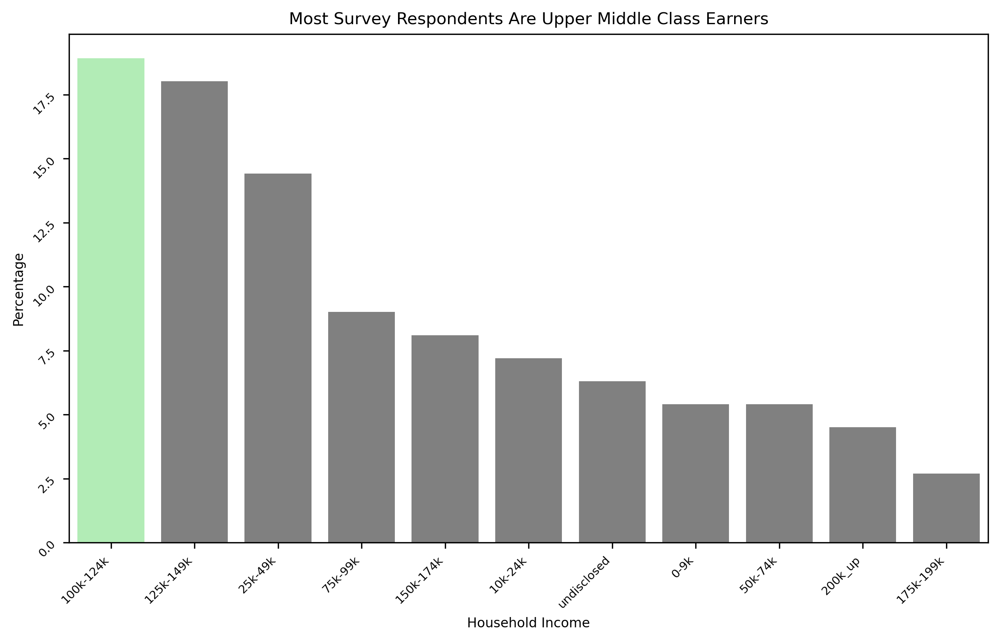

In [17]:
plot_percentages(july25,'Household Income', 'Household Income',
           'Most Survey Respondents Are Upper Middle Class Earners')

In [18]:
income_brackets = { "25k-49k":'low',
"50k-74k":"mid",
"75k-99k":"mid",
"125k-149k":"mid",
"100k-124k":"mid",
 "0-9k":"low",
"undisclosed":"undisclosed",
"150k-174k":"high",
"10k-24k":"low",
 "200k_up":"high",
"175k-199k":"high"}

In [19]:
july25['Household_Income'] = july25['Household Income'].replace(income_brackets)

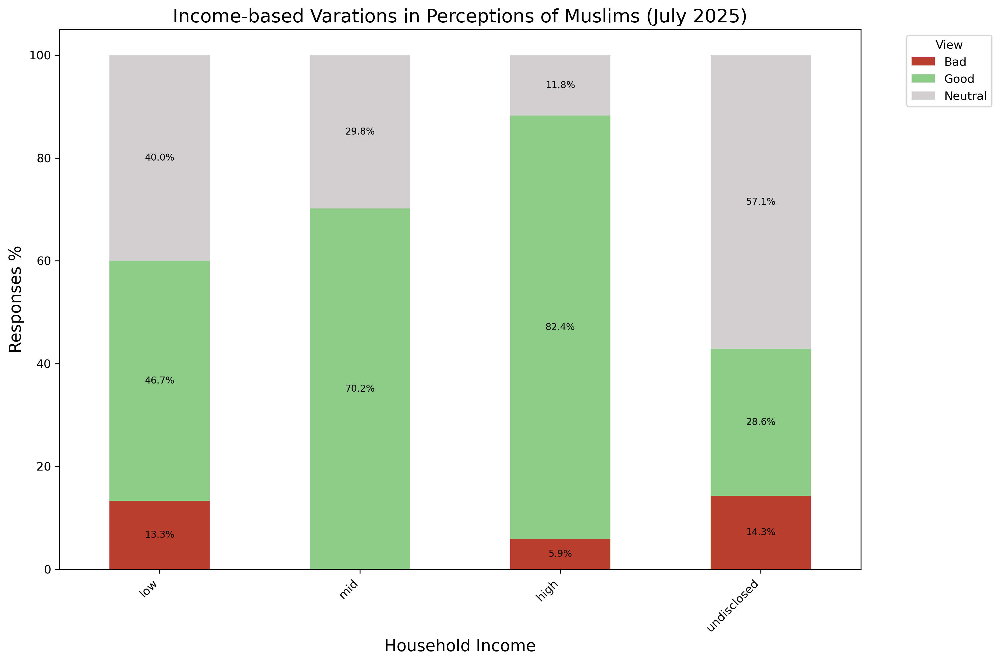

In [20]:
order = ['low','mid','high', 'undisclosed']

plot_income(
    df=july25, 
    title='Income-based Varations in Perceptions of Muslims (July 2025)',
    xlabel='Household Income',
    ylabel='Responses %',
    cat_col='Household_Income',
    sent_col='How do you feel about Muslim people in America?',
    cat_order=order
)

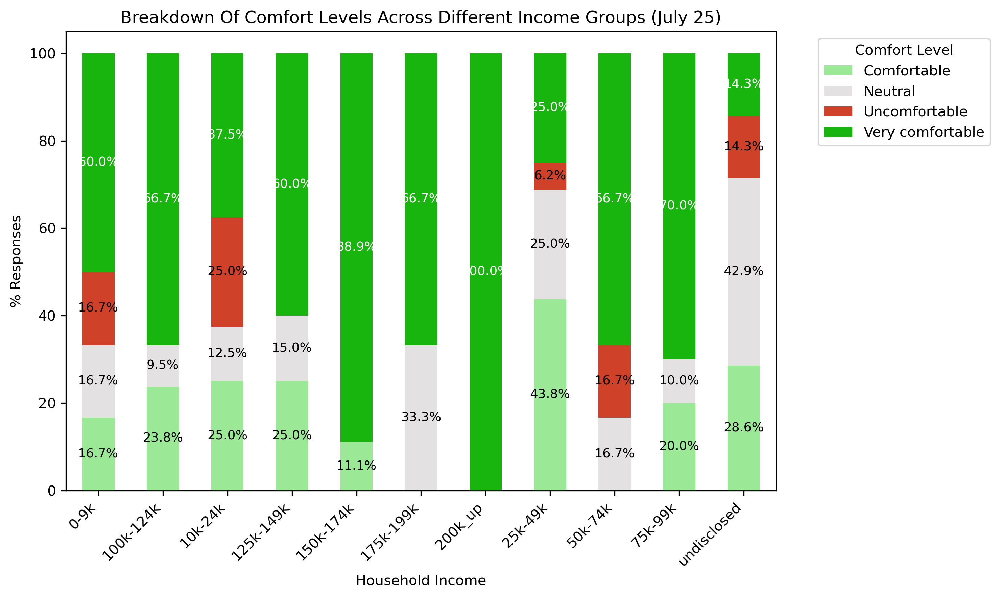

In [53]:
plot_comfort(
    df= july25, 
    category_col= 'Household Income',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different Income Groups (July 25)',
    xlabel='Household Income',
    ylabel='% Responses',
)

**Higher-income respondents expressed the most favorable views toward Muslims, while unfavorable sentiment was most concentrated among low-income and undisclosed-income groups.**

There is a clear income-based difference in perceptions of Muslims. 
Positive views are strongest among those with higher incomes, while negative sentiment is more prevalent among those with lower or undisclosed income levels. The mid-income group demonstrates high positivity and no hostility, while the undisclosed group leans heavily neutral, suggesting disengagement or uncertainty. 



# Region Vs Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/More_Than_Half_of_Survey_Participants_Come_From_Middle_Atlantic_and_Pacific_Regions.png


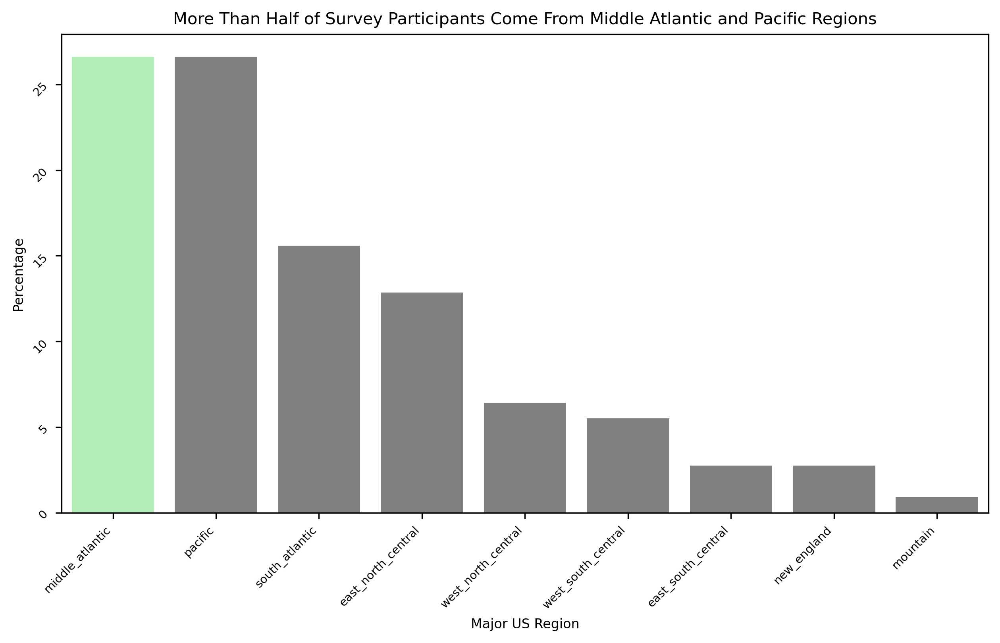

In [22]:
plot_percentages(july25,'Major US Region', 'Major US Region',
                 'More Than Half of Survey Participants Come From Middle Atlantic and Pacific Regions')

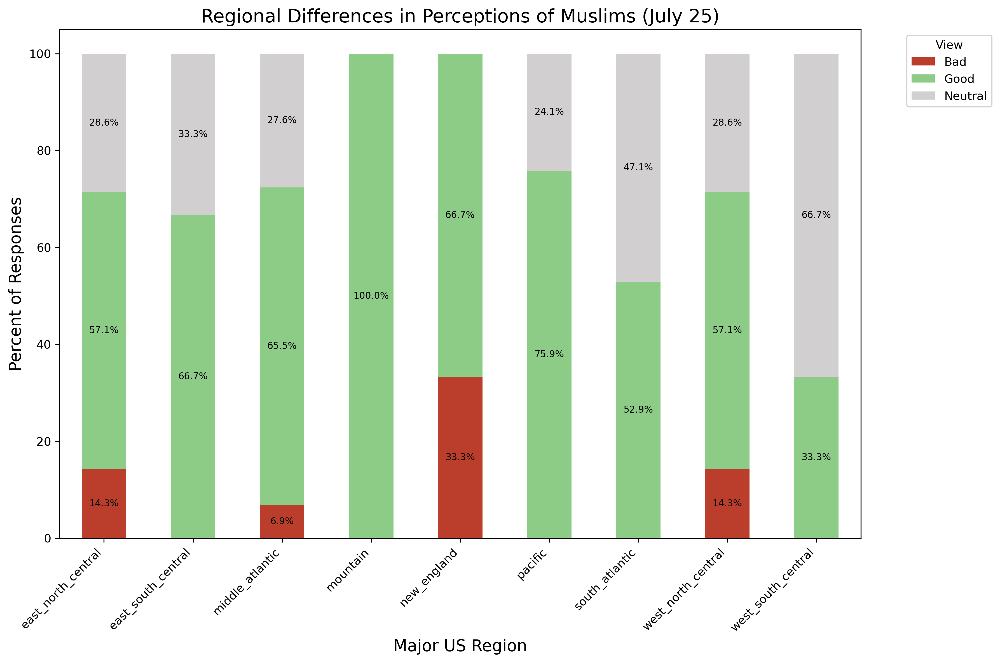

In [23]:
plot_stacked_bar_chart(
    df=july25, 
    title='Regional Differences in Perceptions of Muslims (July 25)',
    xlabel='Major US Region',
    ylabel='Percent of Responses',
    cat_col='Major US Region',
    sent_col='How do you feel about Muslim people in America?'
)

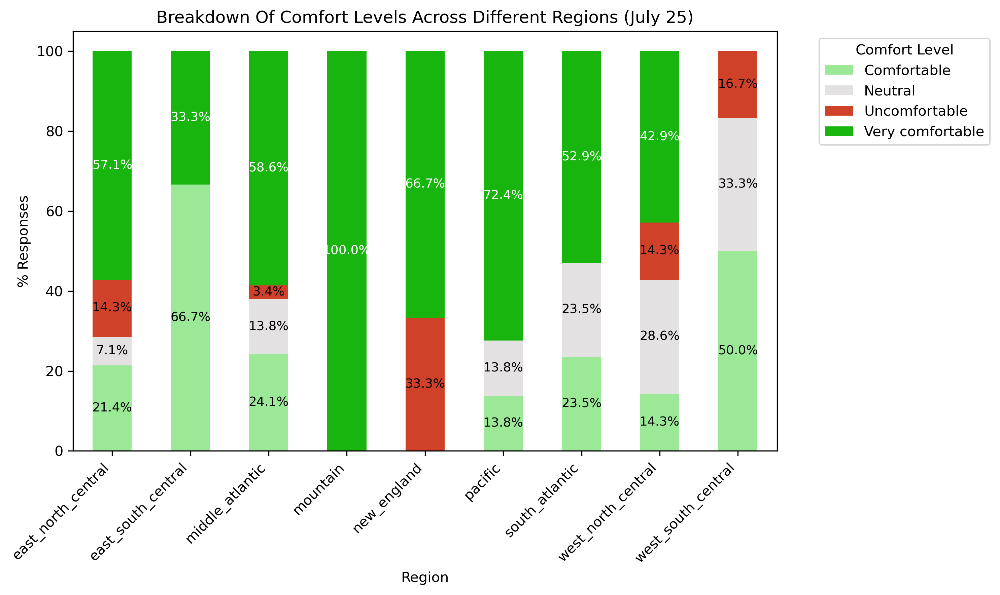

In [55]:
plot_comfort(
    df= july25, 
    category_col= 'Major US Region',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different Regions (July 25)',
    xlabel='Region',
    ylabel='% Responses',
)

## Relationship Between Knowing a Muslim and Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/65%_Of_Respondents_Have_Spoken_to_At_Least_One_Muslim_in_the_Last_7_days_July_25.png


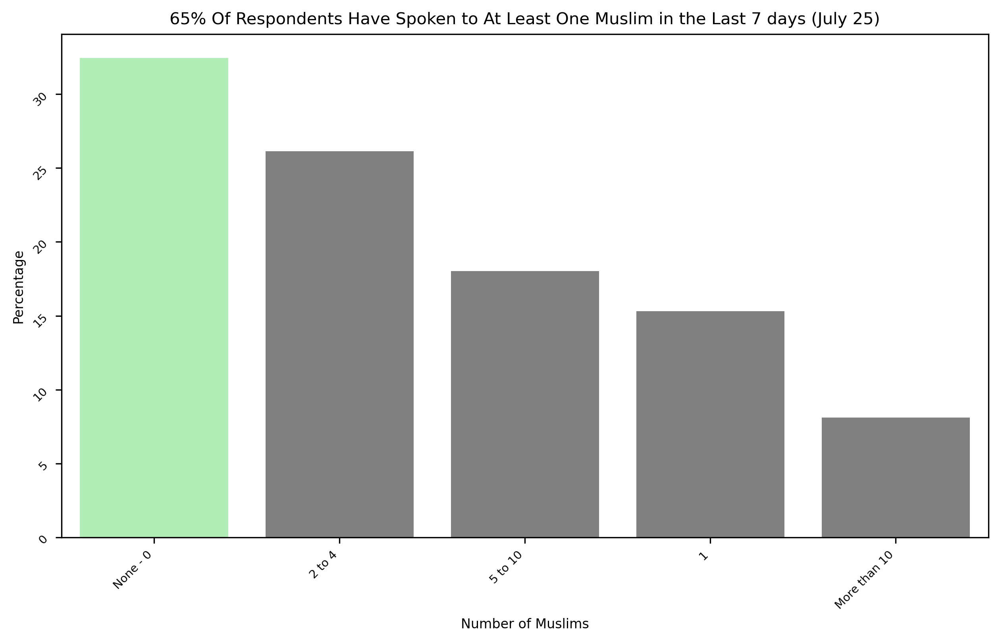

In [56]:
plot_percentages(july25,'How many Muslim people have you talked to in the last 7 days?', 'Number of Muslims',\
           '65% Of Respondents Have Spoken to At Least One Muslim in the Last 7 days (July 25)')

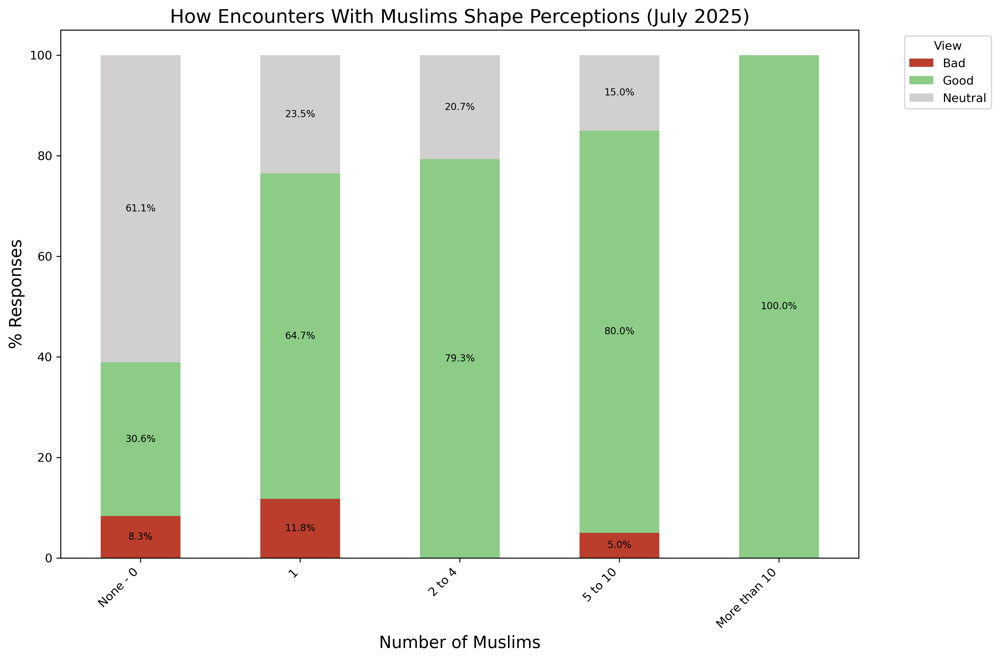

<Figure size 7200x4000 with 0 Axes>

In [25]:
plot_stacked_bar_chart_interaction(
    df=july25, 
    title='How Encounters With Muslims Shape Perceptions (July 2025)',
    xlabel='Number of Muslims',
    ylabel='% Responses',
    cat_col='How many Muslim people have you talked to in the last 7 days?',
    sent_col='How do you feel about Muslim people in America?'
)

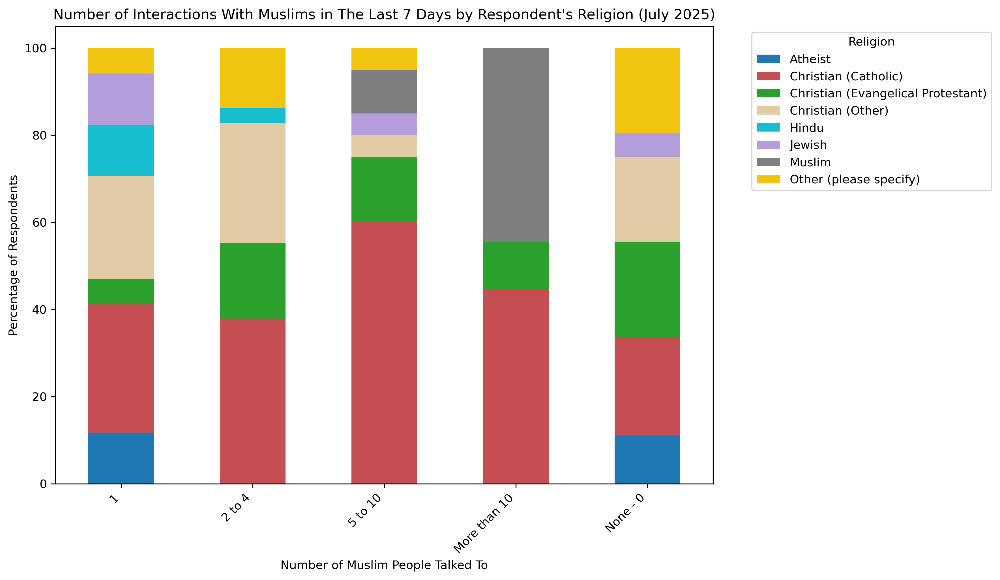

In [26]:
import matplotlib.pyplot as plt

counts = july25.groupby(['How many Muslim people have you talked to in the last 7 days?', 
                        'What is your religion?']).size().unstack()

# Convert counts to percentages
percentages = counts.div(counts.sum(axis=1), axis=0) * 100

# Plotting
percentages.plot(kind='bar', stacked=True, figsize=(10, 7), \
                 color = ['#1f77b4', '#c44e52', '#2ca02c', '#e3cba5', '#17becf',
          '#b39ddb', '#7f7f7f', '#f1c40f', '#a6cee3', '#e7969c']

)

plt.title("Number of Interactions With Muslims in The Last 7 Days by Respondent's Religion (July 2025)")
plt.xlabel("Number of Muslim People Talked To")
plt.ylabel("Percentage of Respondents")
plt.xticks(rotation=45, ha='right') 

plt.legend(title="Religion", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

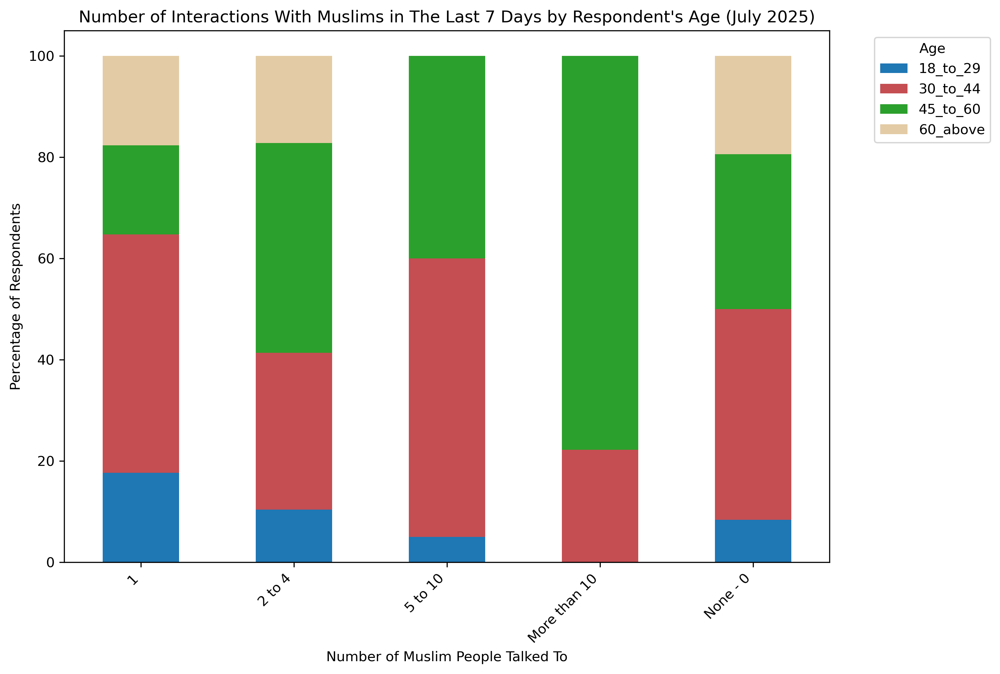

In [58]:
counts = july25.groupby(['How many Muslim people have you talked to in the last 7 days?', 
                        'Age']).size().unstack()

# Convert counts to percentages
percentages = counts.div(counts.sum(axis=1), axis=0) * 100

# Plotting
percentages.plot(kind='bar', stacked=True, figsize=(10, 7), \
                 color = ['#1f77b4', '#c44e52', '#2ca02c', '#e3cba5', '#17becf',
          '#b39ddb', '#7f7f7f', '#f1c40f', '#a6cee3', '#e7969c']

)

plt.title("Number of Interactions With Muslims in The Last 7 Days by Respondent's Age (July 2025)")
plt.xlabel("Number of Muslim People Talked To")
plt.ylabel("Percentage of Respondents")
plt.xticks(rotation=45, ha='right') 

plt.legend(title="Age", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## News Source Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/News_Source_Distribution_July_2025.png


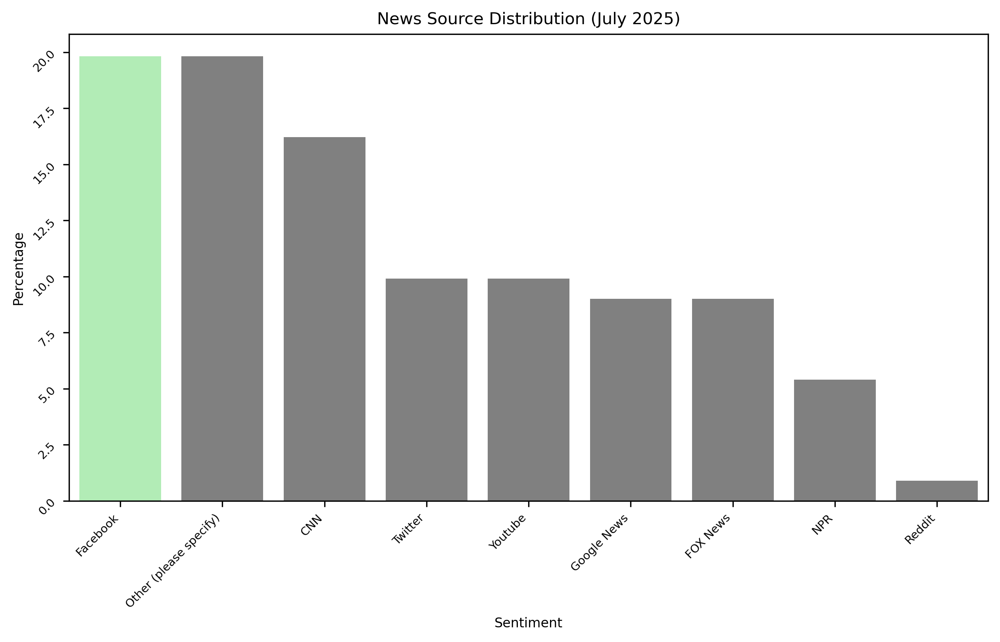

In [28]:
plot_percentages(july25,
                 column_name='Where do you get your news from?',
                 x_label='Sentiment',
                 title='News Source Distribution (July 2025)')

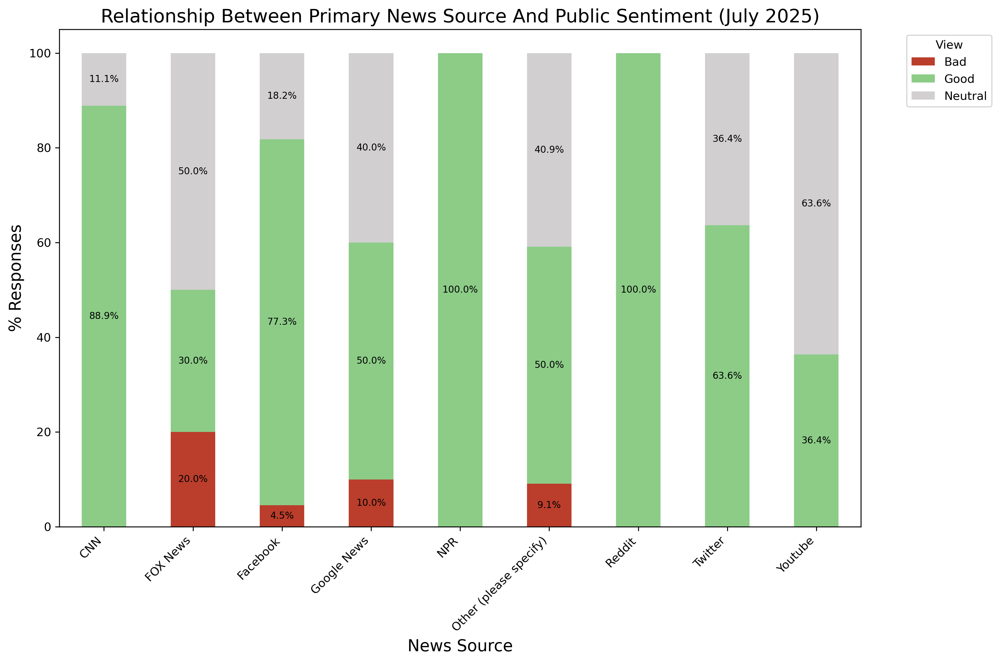

In [29]:
plot_stacked_bar_chart(
    df=july25, 
    title='Relationship Between Primary News Source And Public Sentiment (July 2025)',
    xlabel='News Source',
    ylabel='% Responses',
    cat_col= 'Where do you get your news from?',
    sent_col='How do you feel about Muslim people in America?'
)

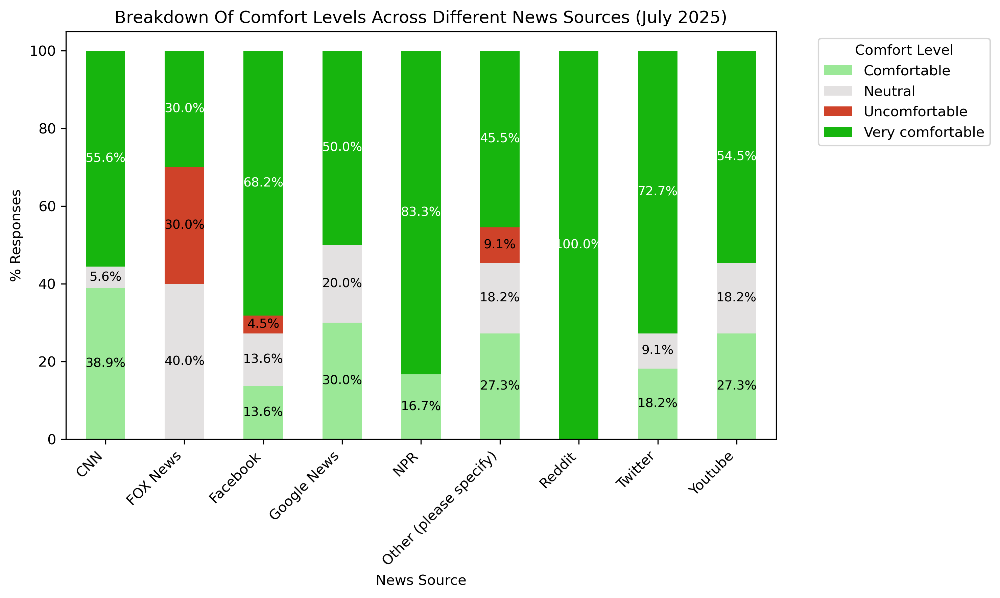

In [30]:
plot_comfort(
    df= july25, 
    category_col= 'Where do you get your news from?',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different News Sources (July 2025)',
    xlabel='News Source',
    ylabel='% Responses',
)

## Relationship Between Exposure to Positive Portrayal and Overall Sentiment

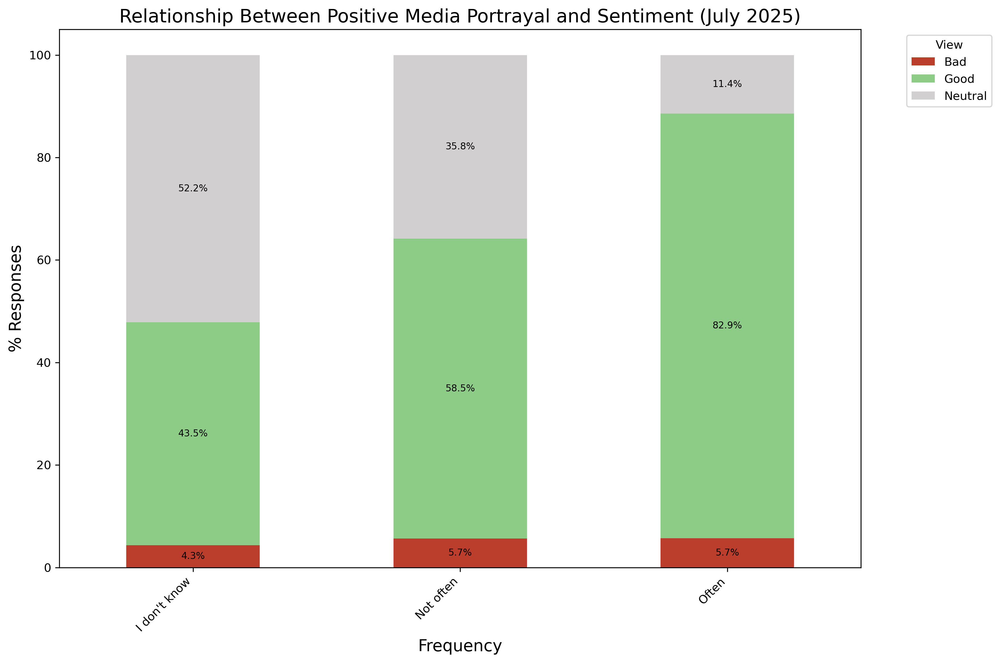

In [31]:
plot_stacked_bar_chart(
    df=july25, 
    title='Relationship Between Positive Media Portrayal and Sentiment (July 2025)',
    xlabel='Frequency',
    ylabel='% Responses',
    cat_col= 'How often do you hear positive things about Muslims in the media?',
    sent_col='How do you feel about Muslim people in America?'
)

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Only_30%_Of_Respondents_Reported_Seeing_Positive_Stories_About_Muslims_in_the_Media_July_2025.png


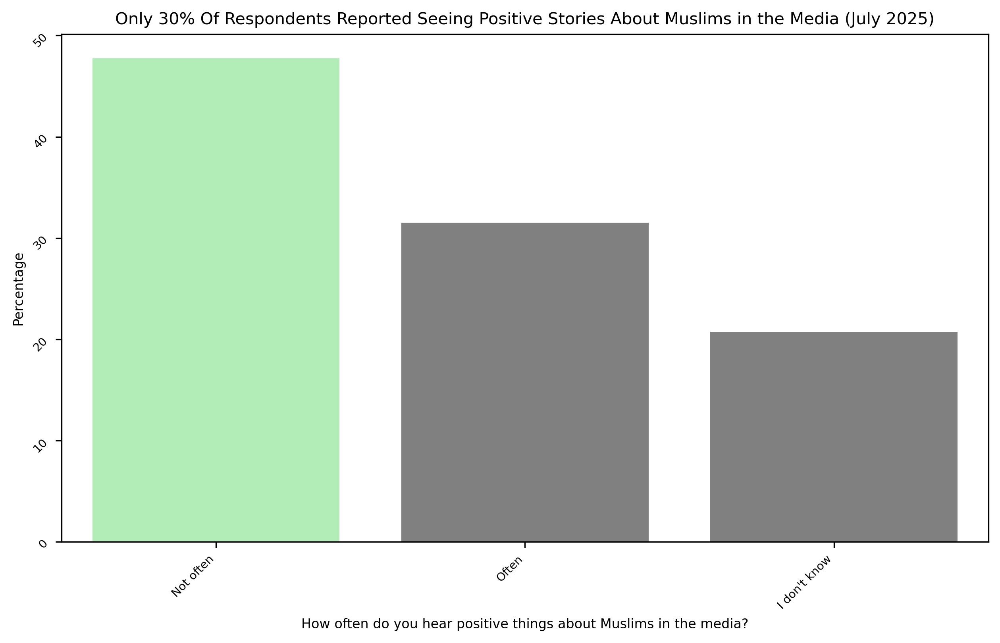

In [32]:
plot_percentages(july25,'How often do you hear positive things about Muslims in the media?', 'How often do you hear positive things about Muslims in the media?',
           'Only 30% Of Respondents Reported Seeing Positive Stories About Muslims in the Media (July 2025)')

In [33]:
pd.crosstab(
    july25['Where do you get your news from?'],
    july25['How often do you hear positive things about Muslims in the media?']
)

How often do you hear positive things about Muslims in the media?,I don't know,Not often,Often
Where do you get your news from?,,,
CNN,2,10,6
FOX News,5,3,2
Facebook,2,5,15
Google News,3,5,2
NPR,1,4,1
Other (please specify),5,16,1
Reddit,0,1,0
Twitter,0,6,5
Youtube,5,3,3


## Relationship between Gender and Sentiment¶

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/55%_of_the_Survey_Participants_Were_Men_july_2025.png


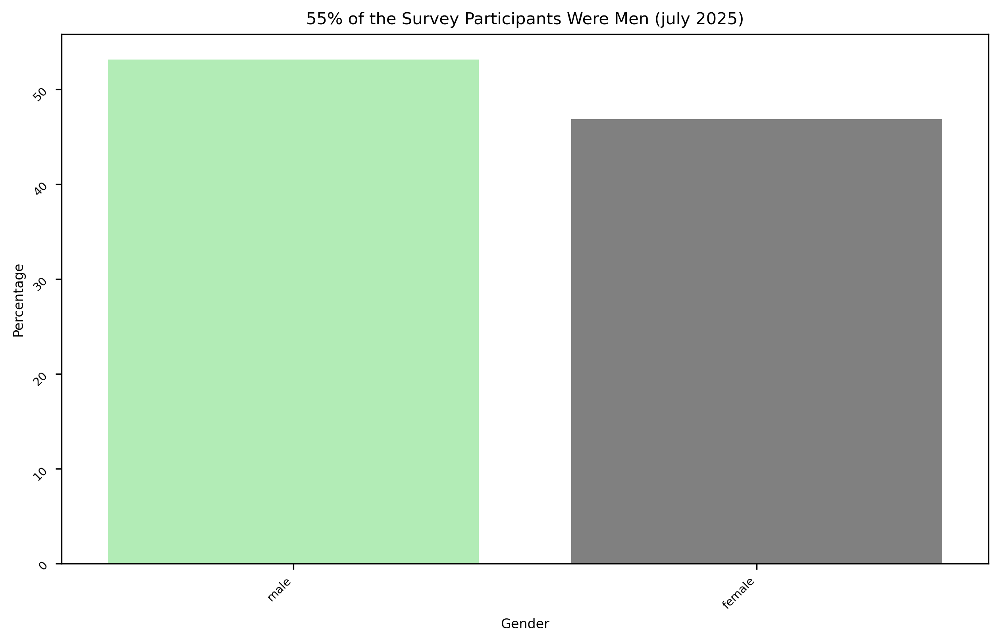

In [34]:
plot_percentages(july25,'Gender', 'Gender',
           '55% of the Survey Participants Were Men (july 2025)')

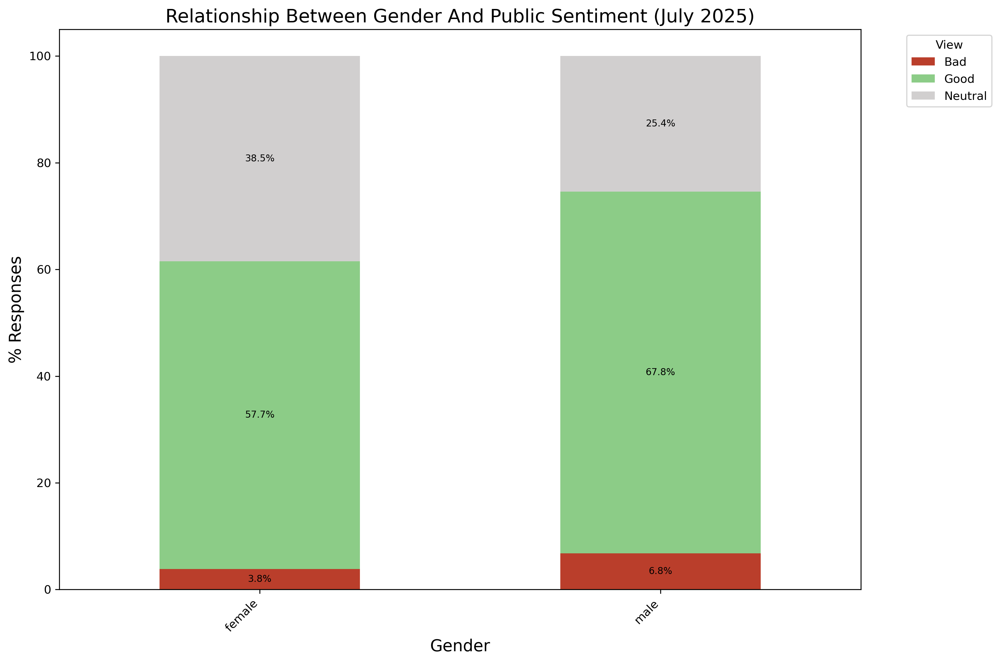

In [35]:
plot_stacked_bar_chart(
    df=july25, 
    title='Relationship Between Gender And Public Sentiment (July 2025)',
    xlabel='Gender',
    ylabel='% Responses',
    cat_col= 'Gender',
    sent_col='How do you feel about Muslim people in America?'
)

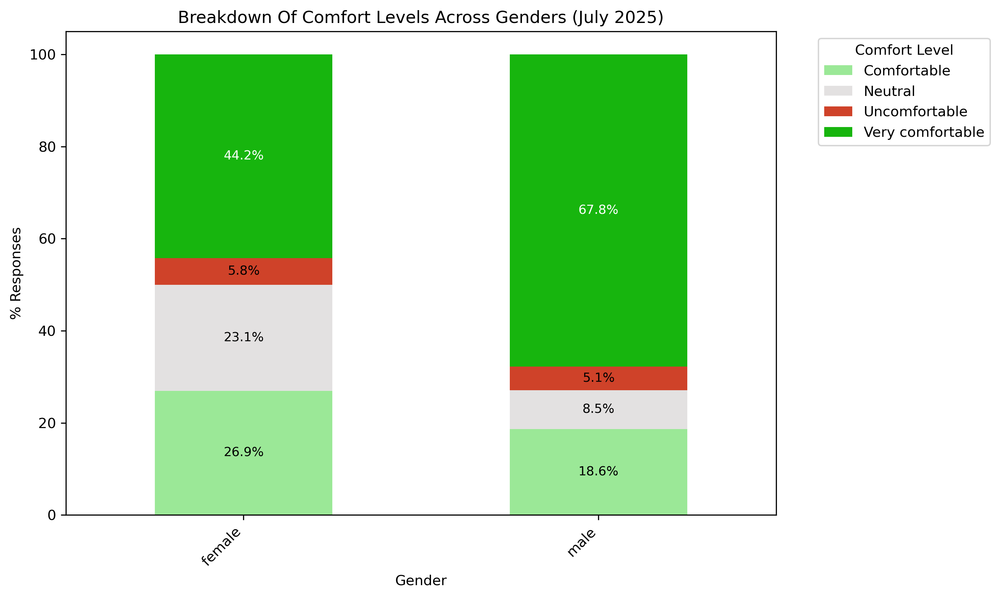

In [36]:
plot_comfort(
    df= july25, 
    category_col= 'Gender',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Genders (July 2025)',
    xlabel='Gender',
    ylabel='% Responses',
)

In [37]:
july25.columns

Index(['What is your religion?', 'Religion_other',
       'How many Muslim people have you talked to in the last 7 days?',
       'How do you feel about Muslim people in America?',
       'What is your level of education?', 'Where do you get your news from?',
       'News_other',
       'How comfortable do you feel interacting with Muslims in your community?',
       'How often do you hear positive things about Muslims in the media?',
       'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?',
       'Would you feel comfortable buying goods or services from a Muslim-owned business?',
       'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?',
       'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?',
       'Do you feel you have a lot in common with Muslims in America?',
       'If you had questions about Islam or Muslims, where would 

## Educational Level vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/45%_of_the_Survey_Participants_Went_to_Graduate_School_july_2025.png


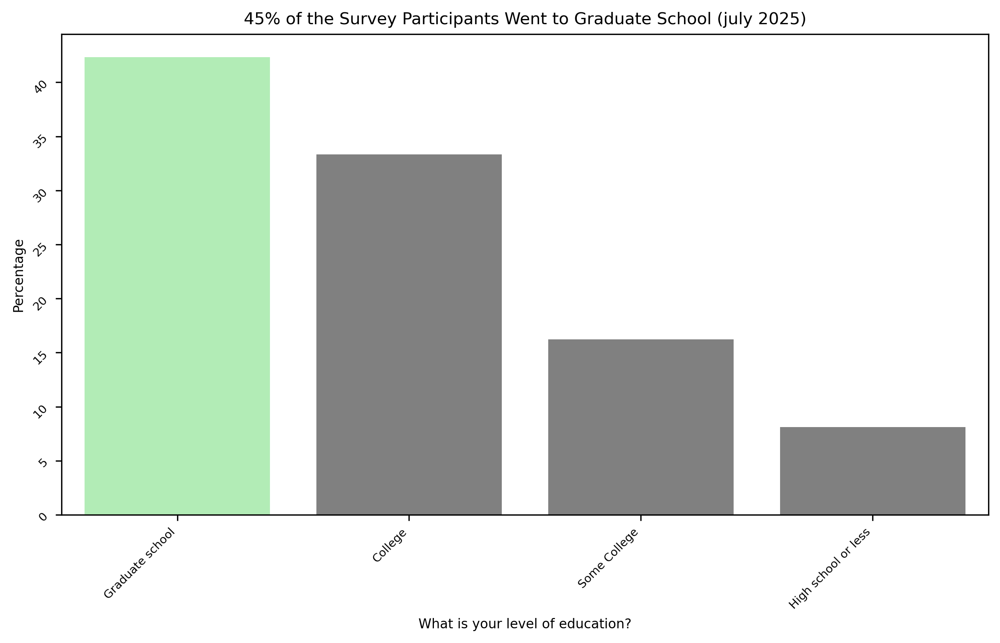

In [40]:
plot_percentages(july25,'What is your level of education?', 'What is your level of education?',
           '45% of the Survey Participants Went to Graduate School (july 2025)')

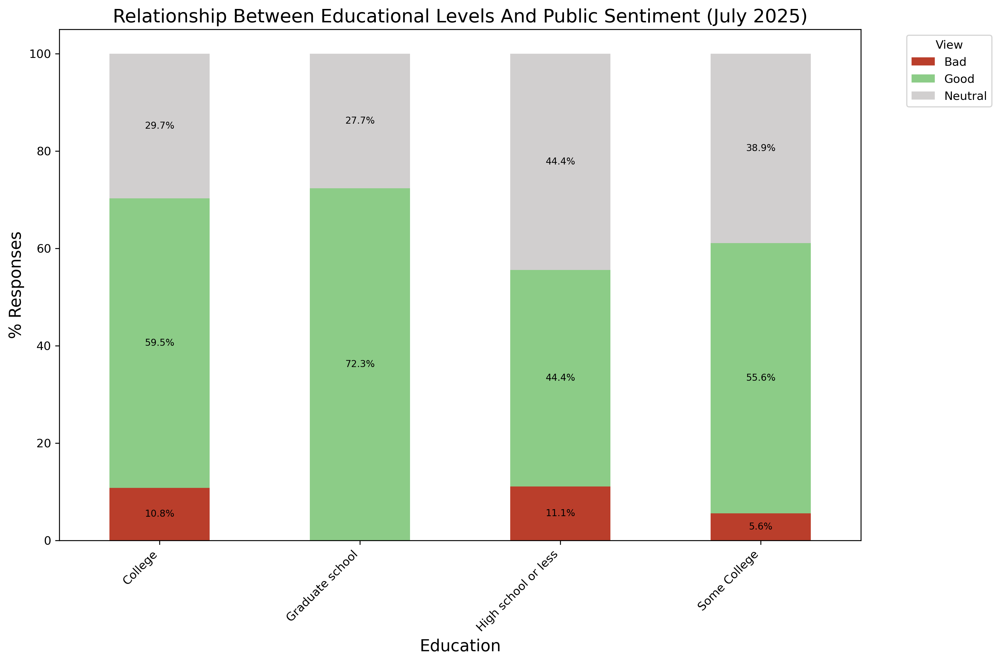

In [38]:
plot_stacked_bar_chart(
    df=july25, 
    title='Relationship Between Educational Levels And Public Sentiment (July 2025)',
    xlabel='Education',
    ylabel='% Responses',
    cat_col= 'What is your level of education?',
    sent_col='How do you feel about Muslim people in America?'
)

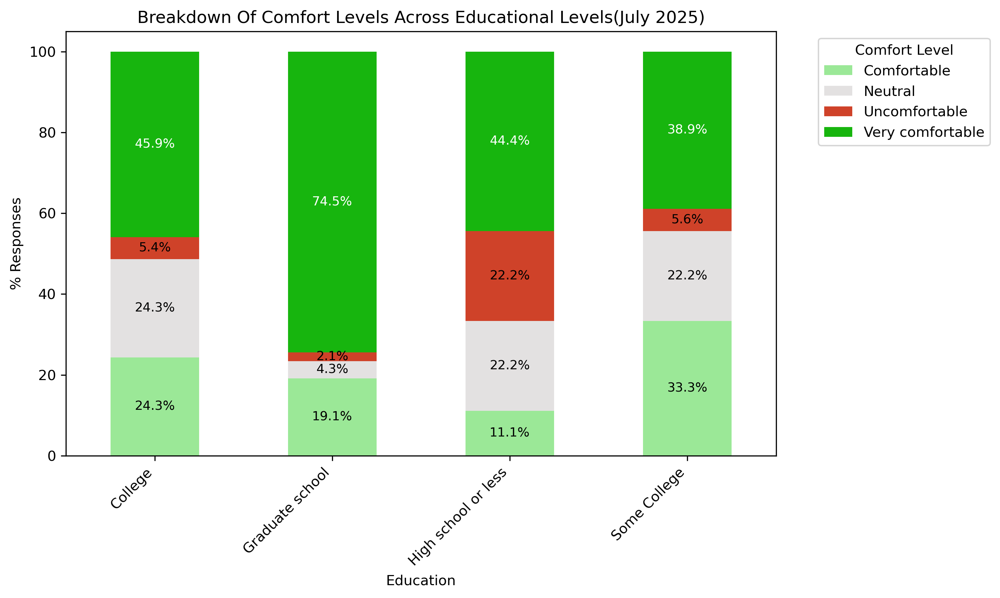

In [41]:
plot_comfort(
    df= july25, 
    category_col= 'What is your level of education?',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Educational Levels(July 2025)',
    xlabel='Education',
    ylabel='% Responses',
)

## Effect Of Exposure Through Events On Overall Sentiment¶

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Distribution_Of_Exposure_to_Muslim-Sponsored_Events.png


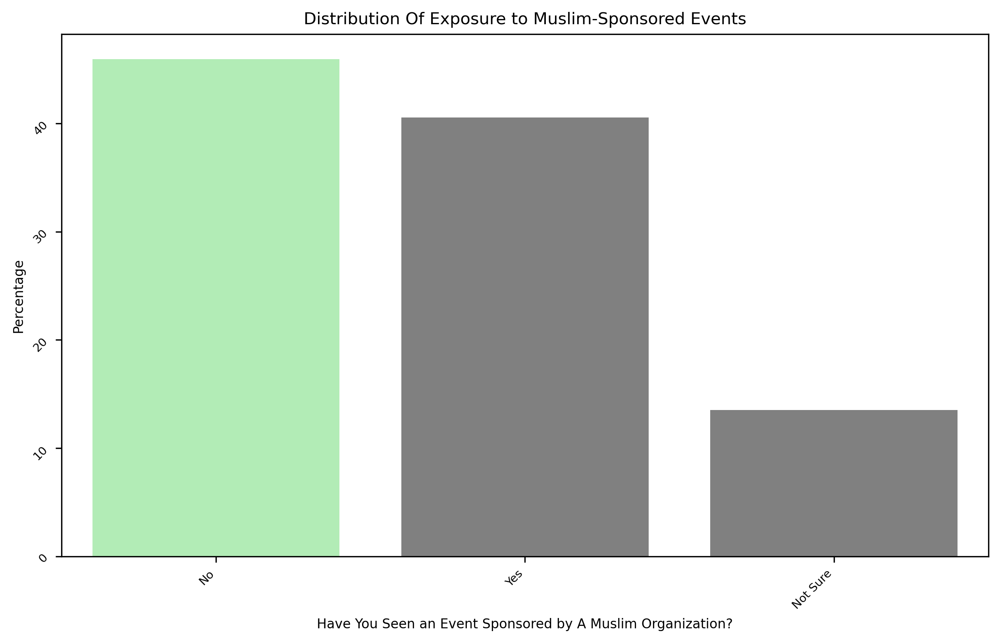

In [63]:
column_name= 'In the last 30 days, have you come across any events or activities \
sponsored by a Muslim person or organization?'
df= july25
x_label= "Have You Seen an Event Sponsored by A Muslim Organization?"
title= "Distribution Of Exposure to Muslim-Sponsored Events"
    
plot_percentages(df, column_name, x_label, title)

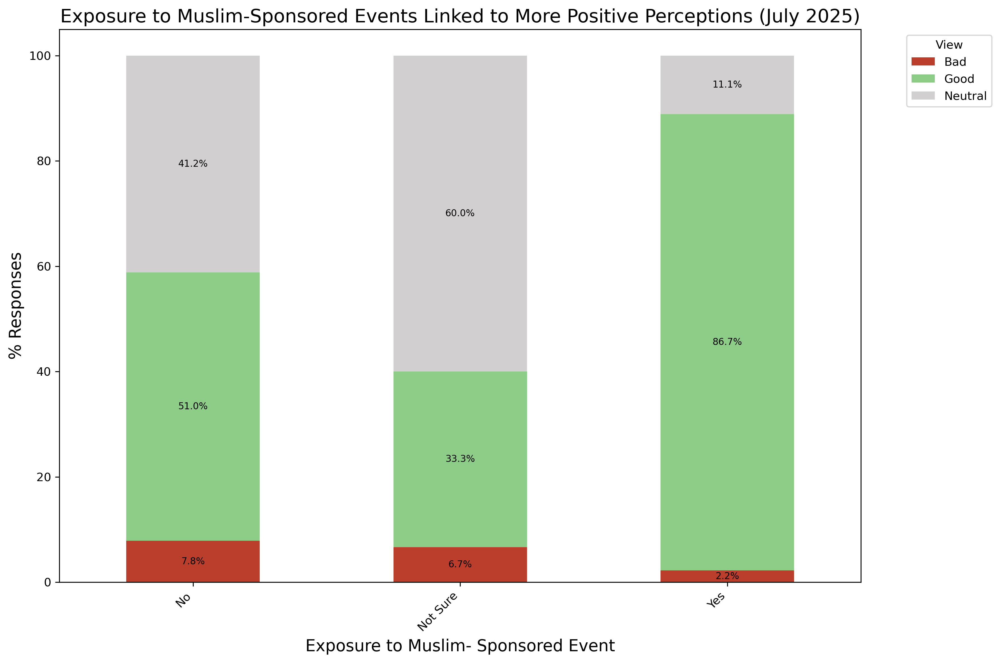

In [66]:
plot_stacked_bar_chart(
    df=july25, 
    title="Exposure to Muslim-Sponsored Events Linked to More Positive Perceptions (July 2025)",
    xlabel='Exposure to Muslim- Sponsored Event',
    ylabel='% Responses',
    cat_col= column_name,
    sent_col='How do you feel about Muslim people in America?'
)

In [75]:
grouped = (
    july25.groupby(['What is your religion?', column_name, 'How do you feel about Muslim people in America?'])
    .size()
    .reset_index(name='count')
)

# Normalize within each religion + exposure group to get percentages
grouped['percent'] = grouped.groupby(['What is your religion?', column_name])['count'].\
transform(lambda x: 100 * x / x.sum())

Text(0.5, 0.98, 'Perceptions of Muslims by Exposure and Religious Affiliation (July 2025)')

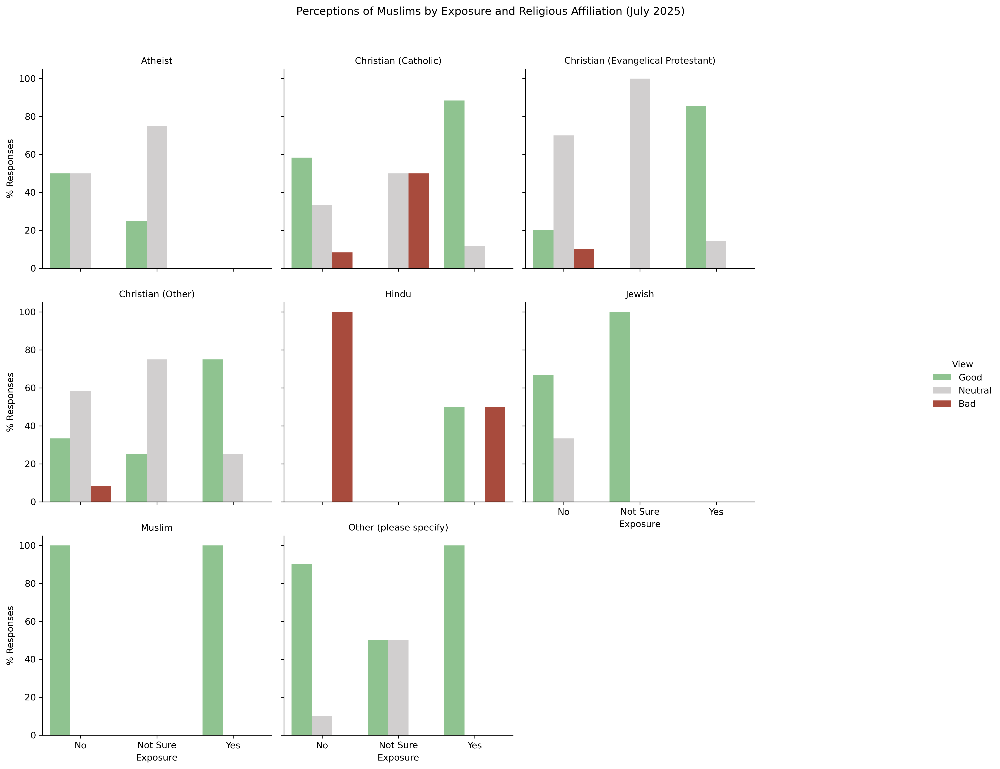

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt

g = sns.catplot(
    data=grouped,
    kind='bar',
    x=column_name,
    y='percent',
    hue='How do you feel about Muslim people in America?',
    col='What is your religion?',
    col_wrap=3,
    height=4,
    palette={'Good': '#86cc87', 'Neutral': '#d1cfcf', 'Bad': '#ba3e2b'}
)

g.set_titles("{col_name}")
g.set_axis_labels("Exposure", "% Responses")
g._legend.set_title("View")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Perceptions of Muslims by Exposure and Religious Affiliation (July 2025)")

In [103]:
sentiment_col = 'How do you feel about Muslim people in America?'
demo_cols =['What is your religion?',
            'What is your level of education?',
            'Where do you get your news from?',
            'Household Income',
            'Gender',
            'Major US Region',
            'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?',
            ]

In [105]:
bad_sentiment_percentages = {}

for col in demo_cols:
    group = (
        july25.groupby(col)[sentiment_col]
        .value_counts(normalize=True)
        .unstack()
        .fillna(0)
    )
    if 'Bad' in group.columns:
        group['Bad %'] = group['Bad'] * 100
        bad_sentiment_percentages[col] = group['Bad %'].sort_values(ascending=False)


In [94]:
for col, data in bad_sentiment_percentages.items():
    print(f"\n=== {col} ===")
    print(data.head())



=== What is your religion? ===
What is your religion?
Hindu                                 66.666667
Christian (Evangelical Protestant)     5.555556
Christian (Catholic)                   5.000000
Christian (Other)                      5.000000
Atheist                                0.000000
Name: Bad %, dtype: float64

=== What is your level of education? ===
What is your level of education?
High school or less    11.111111
College                10.810811
Some College            5.555556
Graduate school         0.000000
Name: Bad %, dtype: float64

=== Where do you get your news from? ===
Where do you get your news from?
FOX News                  20.000000
Google News               10.000000
Other (please specify)     9.090909
Facebook                   4.545455
CNN                        0.000000
Name: Bad %, dtype: float64

=== In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization? ===
In the last 30 days, have you come ac

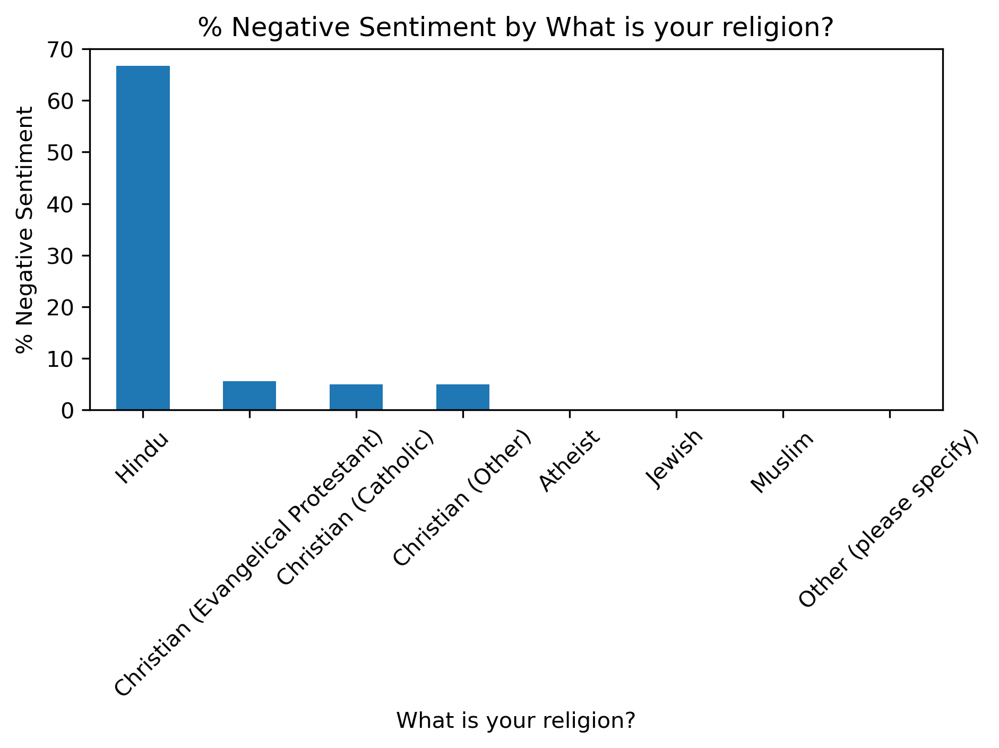

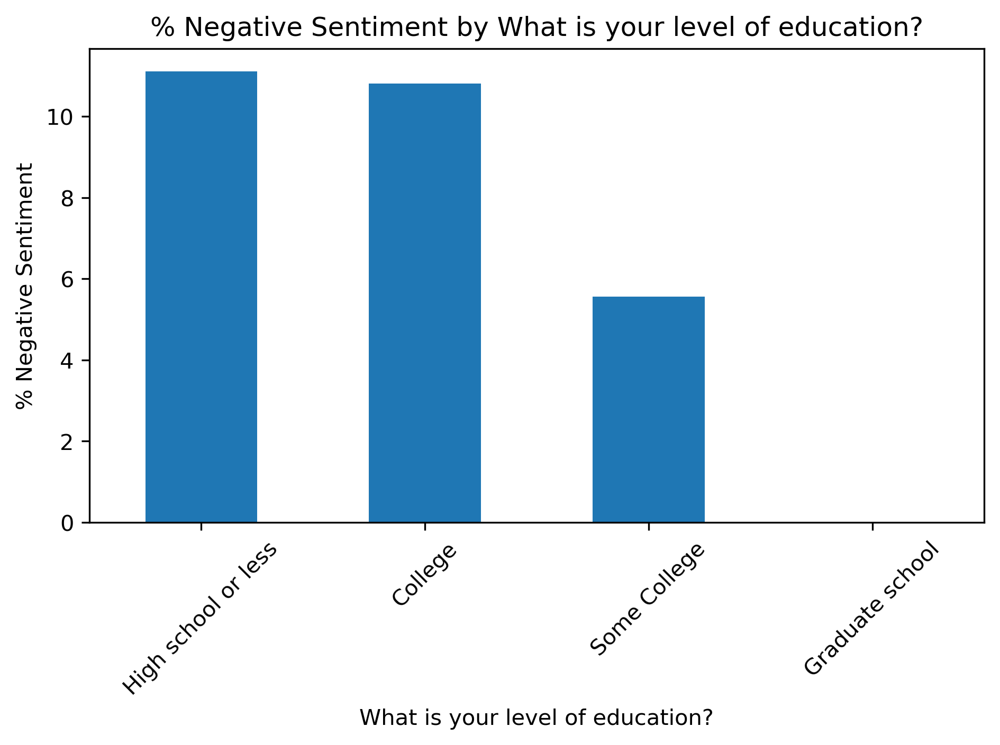

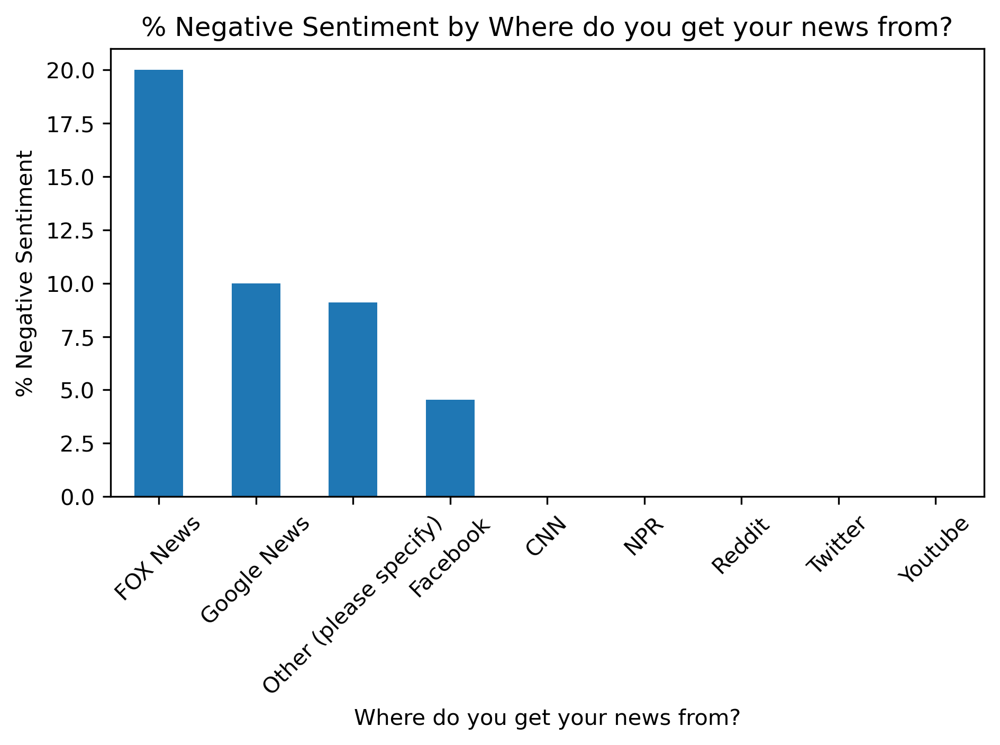

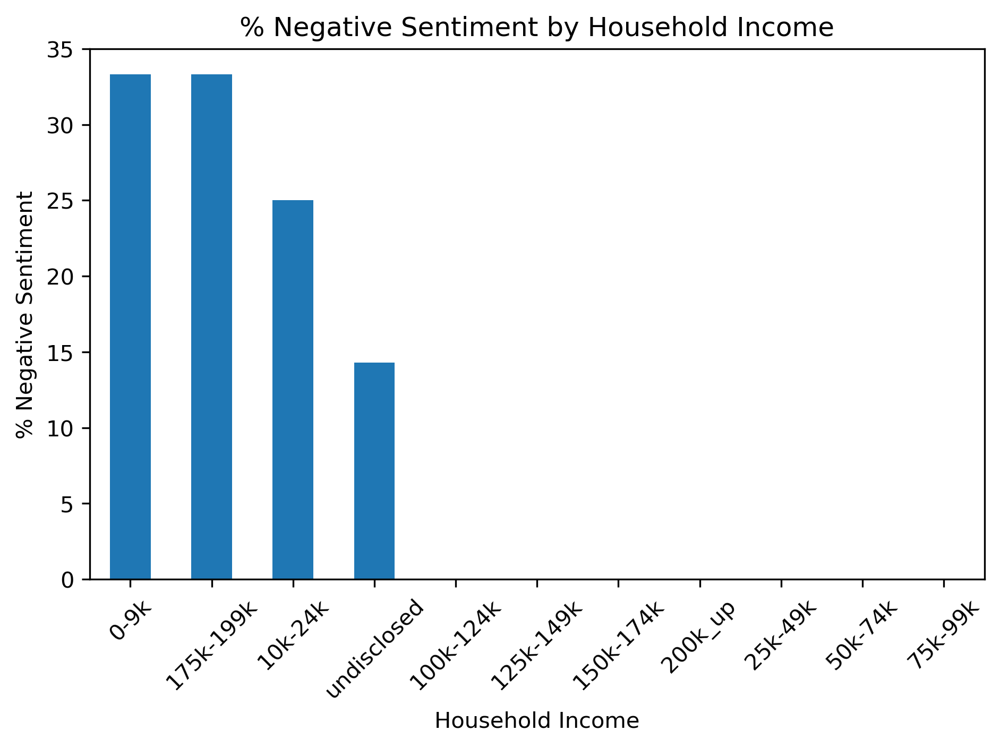

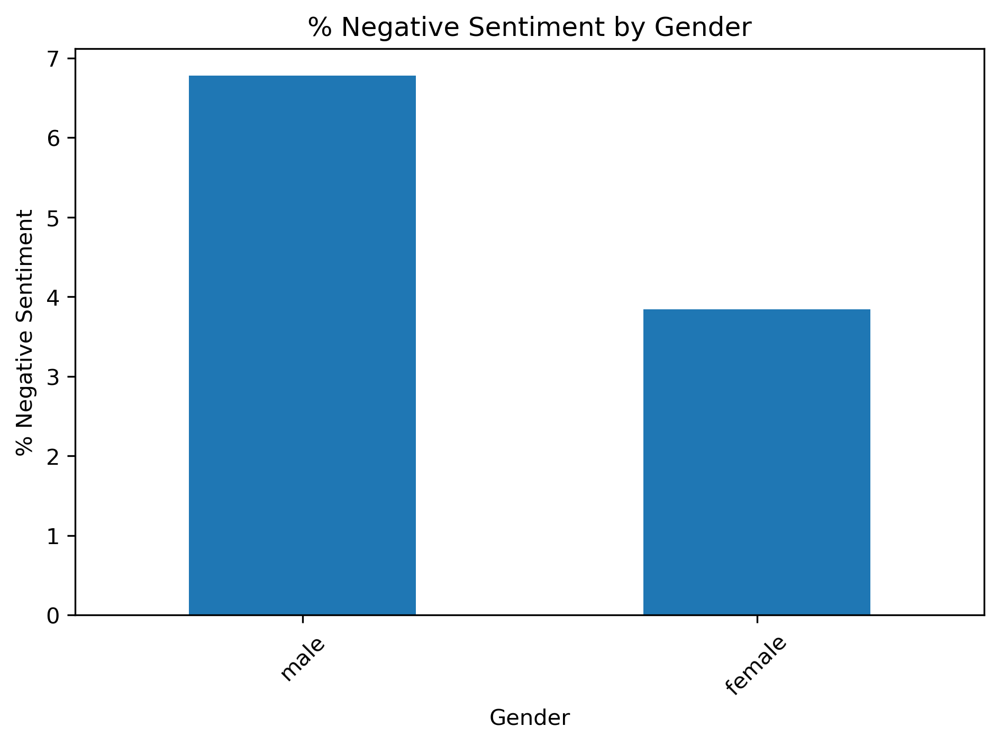

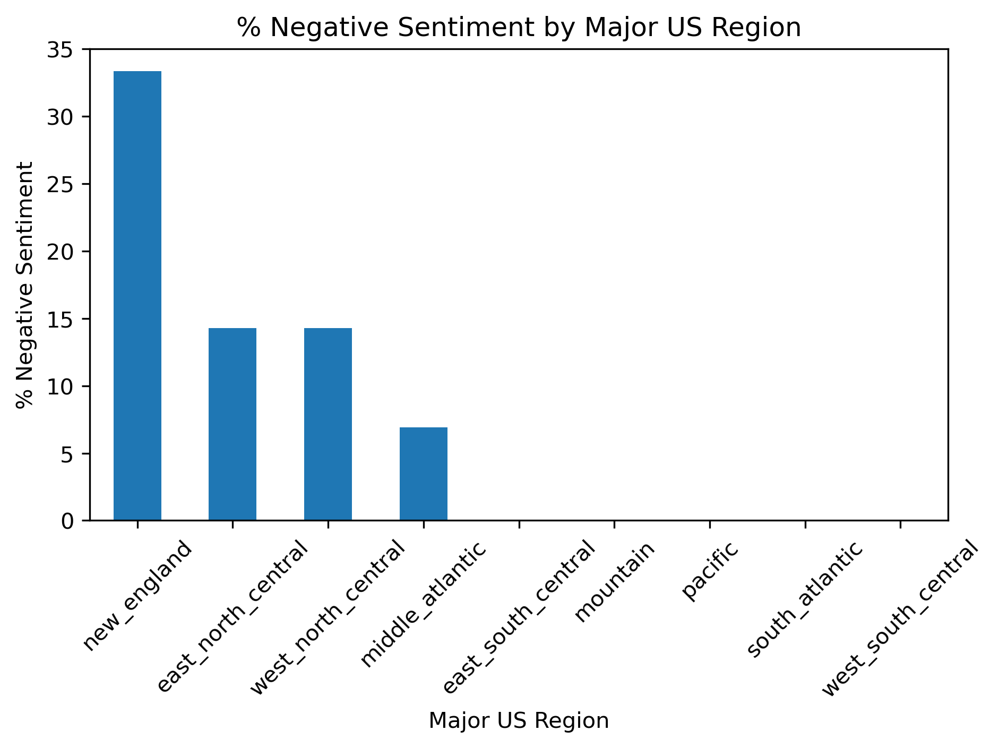

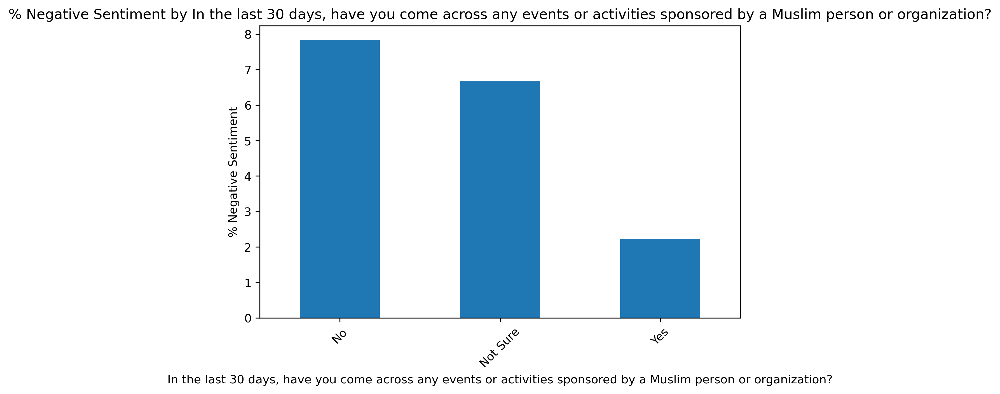

In [106]:
for col, data in bad_sentiment_percentages.items():
    data.plot(kind='bar', title=f'% Negative Sentiment by {col}')
    plt.ylabel('% Negative Sentiment')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


### Columns to examine


* 'Would you feel comfortable buying goods or services from a Muslim-owned business?',
* 'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?',
* 'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?',
* 'Do you feel you have a lot in common with Muslims in America?',
* 'If you had questions about Islam or Muslims, where would you go to learn more?',
* 'Have you ever changed your opinion about a group of people after getting to know someone personally',

# Level of Engagement with Muslims

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/More_90%_of_the_Survey_Participants_Are_Comfortable_Buying_From_Muslims_july_2025.png


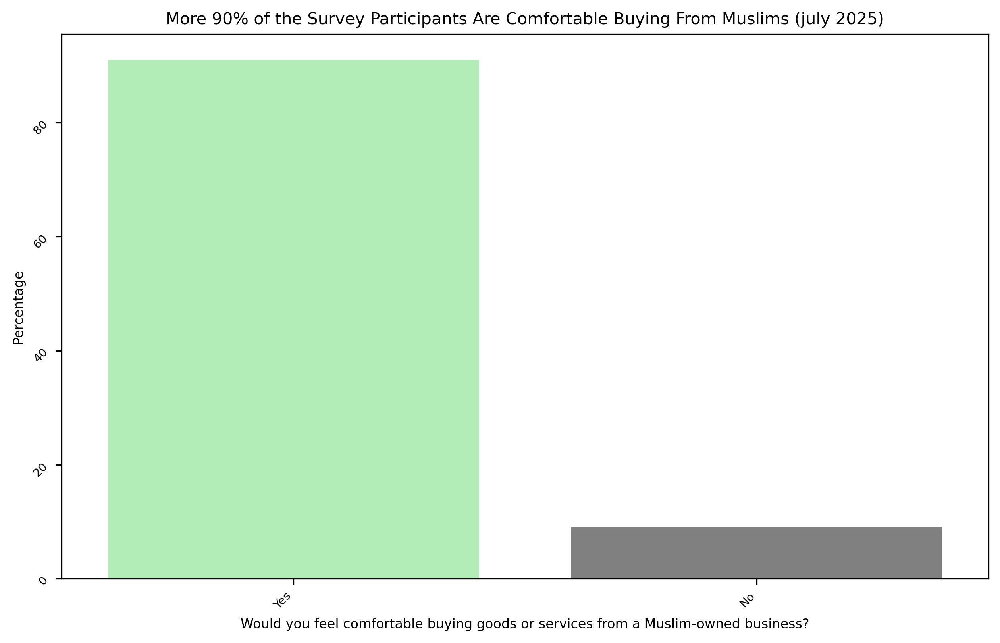

In [109]:
plot_percentages(july25,'Would you feel comfortable buying goods or services from a Muslim-owned business?',\
                 'Would you feel comfortable buying goods or services from a Muslim-owned business?',
           'More 90% of the Survey Participants Are Comfortable Buying From Muslims (july 2025)')

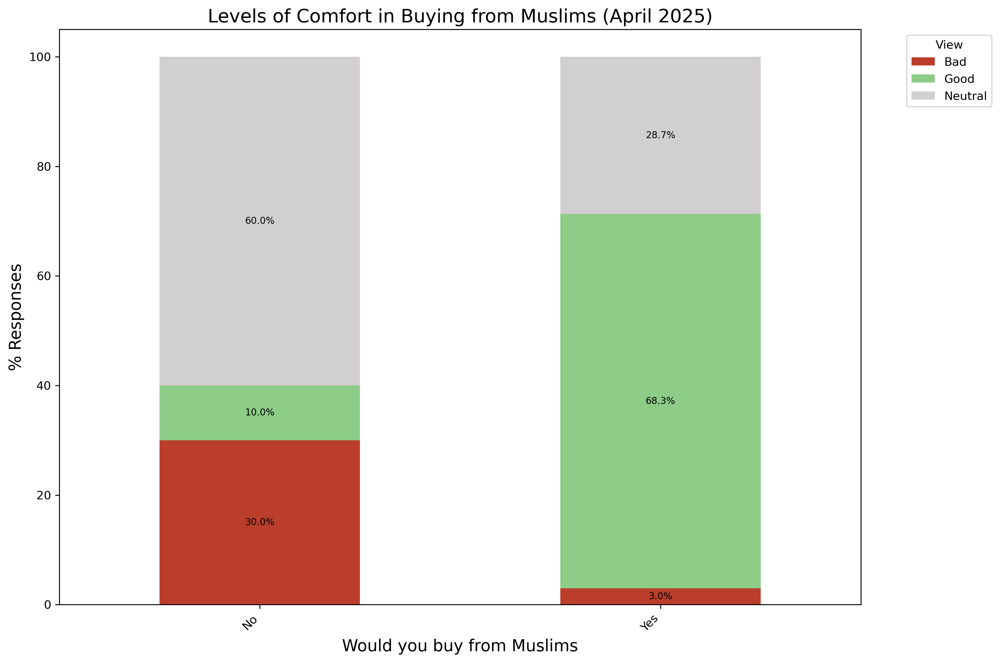

In [112]:
plot_stacked_bar_chart(
    df=july25, 
    title="Levels of Comfort in Buying from Muslims (April 2025)",
    xlabel='Would you buy from Muslims',
    ylabel='% Responses',
    cat_col= 'Would you feel comfortable buying goods or services from a Muslim-owned business?',
    sent_col='How do you feel about Muslim people in America?'
)

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/55%_of_the_Survey_Participants_Are_Comfortable_Visting_A_Mosque_july_2025.png


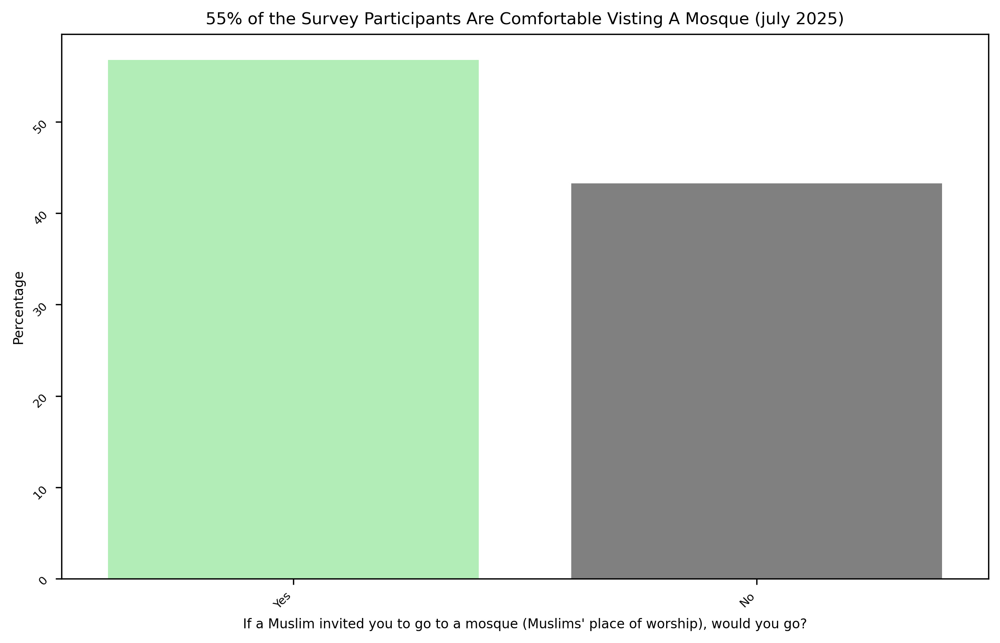

In [117]:
plot_percentages(july25,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",\
                 "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
           "55% of the Survey Participants Are Comfortable Visting A Mosque (july 2025)")

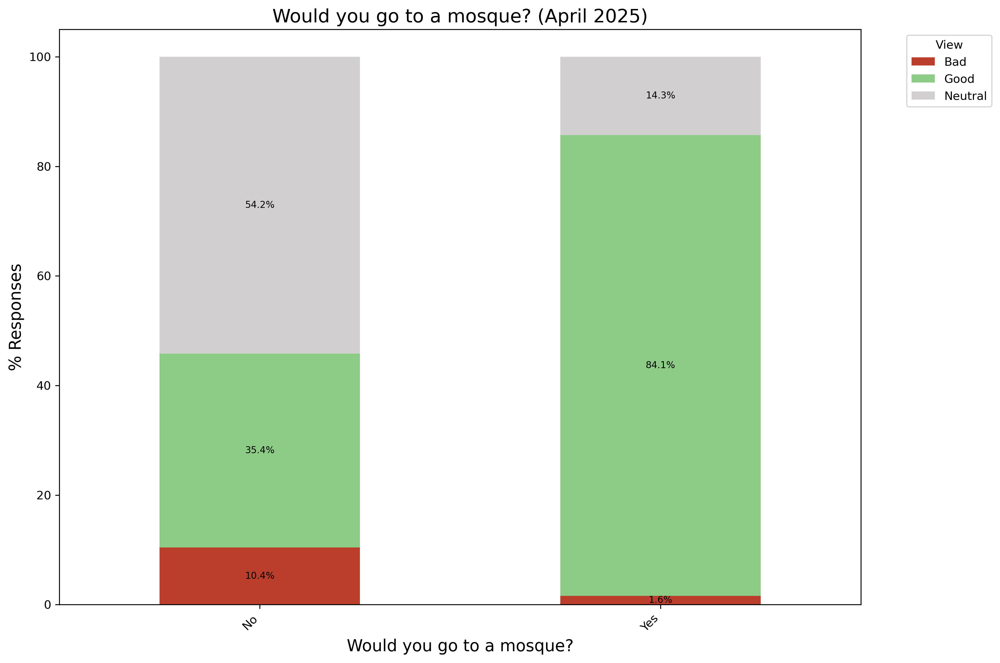

In [156]:
plot_stacked_bar_chart(
    df=july25, 
    title="Would you go to a mosque? (April 2025)",
    xlabel='Would you go to a mosque?',
    ylabel='% Responses',
    cat_col= "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    sent_col='How do you feel about Muslim people in America?'
)

## Characteristics of Those Who Answered No
## “What religions/gender/income group...etc do the ‘No’ respondents belong to?”

In [130]:
def summarize_group(df, columns):
    """
    Returns a DataFrame summarizing the percentage distribution
    of each unique value in the selected columns.

    Parameters:
    - df: The filtered DataFrame (e.g., those who said "No" to visiting a mosque)
    - columns: List of column names to summarize

    Returns:
    - Dictionary of DataFrames for each column
    """
    summary_tables = {}
    for col in columns:
        summary = df[col].value_counts(normalize=True, dropna=False).mul(100).round(1).rename("Percentage")
        summary_tables[col] = summary.to_frame()
    return summary_tables


In [131]:
no_mosque = july25[
    july25["If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?"] == "No"
]

columns_to_summarize = [
    "What is your religion?",
    "Age",
    "Household_Income",
    "Major US Region",
    "Gender",
    "Where do you get your news from?",
    "How do you feel about Muslim people in America?",
    "In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?",
    "How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?",
    "Do you feel you have a lot in common with Muslims in America?",
    "If you had questions about Islam or Muslims, where would you go to learn more?",
    "Have you ever changed your opinion about a group of people after getting to know someone personally"
    
]

summary_results = summarize_group(no_mosque, columns_to_summarize)


In [142]:
print("=======Religion==========")
summary_results["What is your religion?"]
print("=====Age=====")
summary_results["Age"]
print("====Gender======")
summary_results["Gender"]
print("====News======")
summary_results["Where do you get your news from?"]

=======Religion==========


,Percentage
Christian (Catholic),31.2
Christian (Other),25.0
Christian (Evangelical Protestant),18.8
Atheist,8.3
Other (please specify),8.3
Hindu,4.2
Jewish,2.1
Muslim,2.1


=====Age=====


,Percentage
30_to_44,37.5
45_to_60,33.3
60_above,18.8
18_to_29,10.4


====Gender======


,Percentage
female,50.0
male,50.0


====News======


,Percentage
Other (please specify),22.9
Facebook,16.7
CNN,14.6
FOX News,12.5
Youtube,12.5
Google News,12.5
Twitter,8.3


Of everyone who said "No", 31.2% were Catholic, 25% were "Christian (Other)", 8.3% were atheists.
Of everyone who said "No", 22% were in the other category for news, 16% were Facebook users..etc

## “What proportion within each religious group said they wouldn’t go to the mosque?”

To avoid misinterpretation, without normalizing by group size, large groups (like Catholics) may dominate the "No" responses just because there are more of them — not because they are more likely to say "No."

In [145]:
def percent_group_said_no(df, question_col, response_value, group_col):
    """
    Calculates the percentage of respondents in each group (e.g., religion)
    who answered a specific response (e.g., "No") to a given question.

    Parameters:
    - df: pandas DataFrame containing the survey data
    - question_col: column name for the question (e.g., mosque invitation)
    - response_value: the response of interest (e.g., "No")
    - group_col: demographic column to group by (e.g., religion)

    Returns:
    - A sorted pandas Series with percentages of group members who answered the given response.
    """
    no_counts = df[df[question_col] == response_value][group_col].value_counts()
    total_counts = df[group_col].value_counts()
    no_percentage = (no_counts / total_counts * 100).round(1)
    return no_percentage.sort_values(ascending=False)

In [146]:
percent_group_said_no(
    df=july25,
    question_col="If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    response_value="No",
    group_col="What is your religion?"
)

Atheist                               66.7
Hindu                                 66.7
Christian (Other)                     60.0
Christian (Evangelical Protestant)    50.0
Christian (Catholic)                  37.5
Other (please specify)                30.8
Jewish                                20.0
Muslim                                16.7
Name: What is your religion?, dtype: float64

In [147]:
percent_group_said_no(
    df=july25,
    question_col="If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    response_value="No",
    group_col="Household_Income"
)

undisclosed    57.1
low            53.3
mid            40.4
high           29.4
Name: Household_Income, dtype: float64

In [148]:
percent_group_said_no(
    df=july25,
    question_col="If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    response_value="No",
    group_col="Where do you get your news from?"
)

FOX News                  60.0
Google News               60.0
Youtube                   54.5
Other (please specify)    50.0
CNN                       38.9
Facebook                  36.4
Twitter                   36.4
NPR                        NaN
Reddit                     NaN
Name: Where do you get your news from?, dtype: float64

In [149]:
percent_group_said_no(
    df=july25,
    question_col="If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    response_value="No",
    group_col="Have you ever changed your opinion about a group of people after getting to know someone personally"
)

Not sure    62.5
No          56.2
Yes         36.7
Name: Have you ever changed your opinion about a group of people after getting to know someone personally, dtype: float64

In [150]:
july25.columns

Index(['What is your religion?', 'Religion_other',
       'How many Muslim people have you talked to in the last 7 days?',
       'How do you feel about Muslim people in America?',
       'What is your level of education?', 'Where do you get your news from?',
       'News_other',
       'How comfortable do you feel interacting with Muslims in your community?',
       'How often do you hear positive things about Muslims in the media?',
       'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?',
       'Would you feel comfortable buying goods or services from a Muslim-owned business?',
       'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?',
       'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?',
       'Do you feel you have a lot in common with Muslims in America?',
       'If you had questions about Islam or Muslims, where would 

In [151]:
percent_group_said_no(
    df=july25,
    question_col="If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    response_value="No",
    group_col="If you had questions about Islam or Muslims, where would you go to learn more?"
)

I wouldn't seek info    75.0
Internet                69.7
Religious Leaders       25.0
Friends                 22.0
Media                   11.1
Name: If you had questions about Islam or Muslims, where would you go to learn more?, dtype: float64

In [152]:
percent_group_said_no(
    df=july25,
    question_col="If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    response_value="No",
    group_col="How comfortable do you feel interacting with Muslims in your community?"
)

Neutral             88.2
Uncomfortable       66.7
Comfortable         60.0
Very comfortable    22.2
Name: How comfortable do you feel interacting with Muslims in your community?, dtype: float64

In [159]:
percent_group_said_no(
    df=july25,
    question_col="If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    response_value="No",
    group_col="Major US Region"
)

west_south_central    83.3
west_north_central    71.4
south_atlantic        47.1
east_north_central    42.9
middle_atlantic       37.9
east_south_central    33.3
new_england           33.3
pacific               31.0
mountain               NaN
Name: Major US Region, dtype: float64

## Common Grounds With Muslims

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/A_little_Over_50%_of_Survey_Participants_Feel_They_Have_A_Lot_In_Common_With_Muslims_july_2025.png


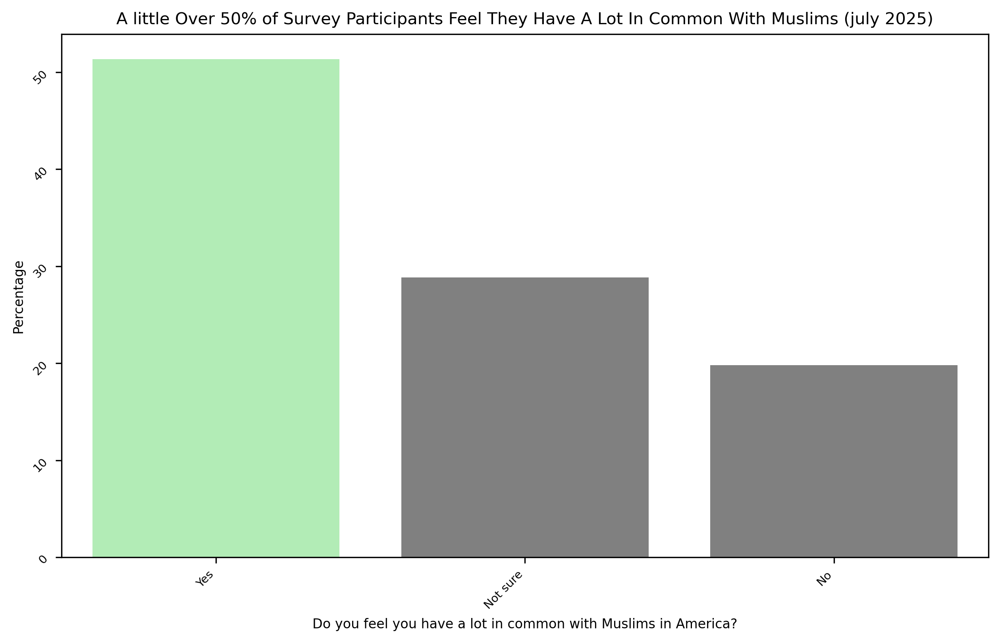

In [155]:
plot_percentages(july25,'Do you feel you have a lot in common with Muslims in America?',\
                 'Do you feel you have a lot in common with Muslims in America?',
           'A little Over 50% of Survey Participants Feel They Have A Lot In Common With Muslims (july 2025)')

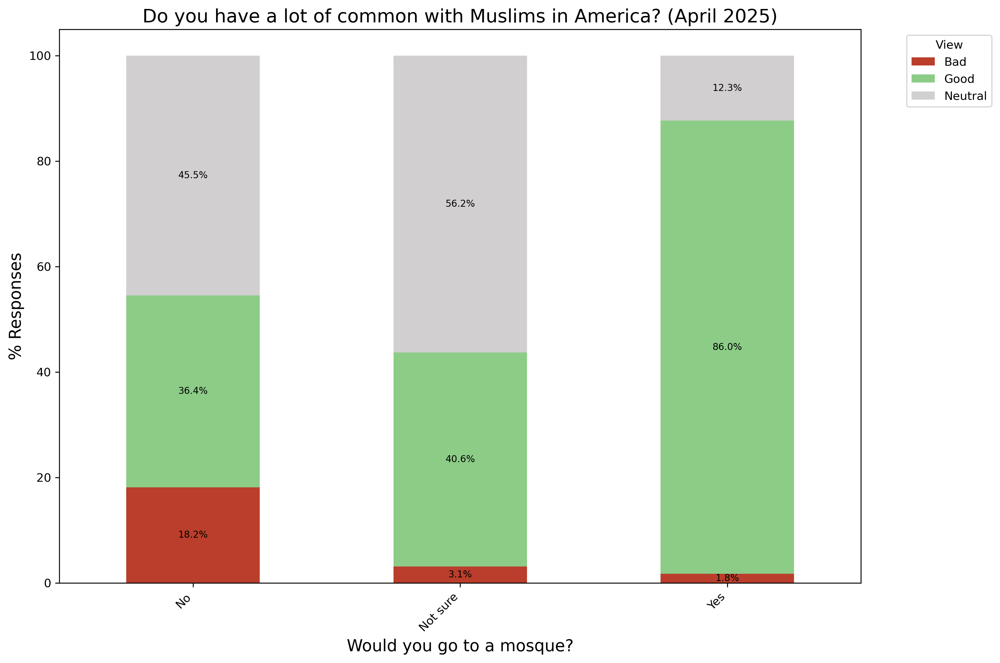

In [160]:
plot_stacked_bar_chart(
    df=july25, 
    title="Do you have a lot of common with Muslims in America? (April 2025)",
    xlabel='Would you go to a mosque?',
    ylabel='% Responses',
    cat_col= "Do you feel you have a lot in common with Muslims in America?",
    sent_col='How do you feel about Muslim people in America?'
)